# Assimilating Morning, Evening, and Nighttime Greenhouse Gas Observations in Atmospheric Inversions: Code for data analysis

Monteiro, et al., 2024

- This code reads trace gas mole fractions from tower sites with 2 (or more) inlet levels 
- Provides the analisys for windspeed criterion for assimilating additional observations in atmospheric inversion models


* Updated version in Jupyter notebook: 30/05/2024 - Version prepared for GitHub//JGR request 
* Created by Vanessa Monteiro

## Load packages and libraries

In [1]:
from Add_Data_Functions import *
from Wind_Cities import *

C:\Users\nani_\AppData\Roaming\Python\Python39\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


### Choose the gas (co2 or ch4)

In [2]:
###### Trace gas you are interested: 
gas = 'ch4'  #co2 or ch4 

In [3]:
## units
if gas == 'co2':
    unit = 'ppm'
if gas == 'ch4':
    unit = 'ppb'
    
## Define city, site and year(s)
city = 'IND'
site = 'SITE02' 
year = 2016

## Define periods (- Note that the code is written to understand the UTC to EST.):
periods = [ '0-4 AM LT','5-8 AM LT','9-11 AM LT', '12-4 PM LT', '5-8 PM LT','9-11 PM LT'] # periods of the day you might want to look at


### Files path

In [4]:
path = {}
path['WSOBS'] = '../DATA_SAMPLE/WSP-OBS.csv'#path + filename wind speed - OBSERVATIONS
path['WSMODEL'] = '../DATA_SAMPLE/WSP-WRF_2016.csv'#PATH+FILENAME WIND FROM WRF
path['ABL'] = '../DATA_SAMPLE/ABL_WRF-Lidar_1H-AVG_2016.csv'#PATH+FILENAME ABL
path['TKE'] = '../DATA_SAMPLE/TKE_SITE02.csv' #path+filename TKE file
path['XSMODEL'] ='../DATA_SAMPLE/XS_SITE02-40M.csv' #
path['BG'] = '../DATA_SAMPLE/indianapolis_BACKGROUND_CO2-CO-CH4.csv' #pathe+filename background
path['TG_TOP'] = '../DATA_SAMPLE/indianapolis_'+gas+'_SITE02_40M_1_hour.txt'
path['TG_BOT'] = '../DATA_SAMPLE/indianapolis_'+gas+'_SITE02_10M_1_hour.txt'
#for figs 8 and 9
path_airports = '../DATA_SAMPLE/AIRPORTS/*'

### Headers 

In [5]:
header = {}
header['ABL'] = ['Date', 'ABL_Model','ABL_Lidar'] 
header['WSMODEL'] = ['Date', 'VWRF', 'UWRF', 'WRF_WS']  
header['TKE'] = ['Date', 'TKE_level3']
header['BG'] = ['Date', 'drct(deg)','wsp(ms)','co2_bg','co_bg','ch4_bg']
header['XSMODEL'] = ['Date','XS_MODEL']
header['TG_TOP'] = ["time", "Date", gas, "std_dev","n","uncertainty","lat","lon","elevation","inlet_top"]
header['TG_BOT'] = ["time", "Date", gas, "std_dev","n","uncertainty","lat","lon","elevation","inlet_bot"]

# READ DATA 

## Clear Dictionaries to store data

In [6]:
DATA = {}

In [7]:
OUTPUTS = {}

## READ WEATHER DATA

* WIND SPEED FROM AIRPORT

- source: https://mesonet.agron.iastate.edu/request/download.phtml?network=IN_ASOS)                       


In [8]:
#### This function reads a file in the format "city_weather.csv", with columns with only speed (mph) and datetime utc
DATA['WSOBS'] = read_weather(path['WSOBS'],year)
#DATA['WSOBS'].head()

## READ OTHER DATA SOURCES  

* 'ABL' (Atmospheric Boundary Layer Depth // Boundary Layer Depth from WRF run and lidar observations)
* 'WSP' (Wind speed from WRF run)
* 'TKE' (Turbulent Kinetic Energy; extracted about 50m agl))
* 'BG' (CO2 Background, ppm)
* 'XS_MODEL' (enhancement obtained by the convolution of footprints and emissions estimates (Hestia))


In [9]:
inputs_model = ['WSMODEL','ABL','WSMODEL','TKE','BG', 'XSMODEL']
#Stores the data in a dictionary
for source_data in inputs_model:
    DATA[source_data] = pd.DataFrame(read_model_outputs(path[source_data], header[source_data],year))
#DATA['WSMODEL'].head()

## READ TRACE GAS MOLE FRACTION DATA 

In [10]:
inputs_tracegas = ['TG_BOT','TG_TOP']

for source_data in inputs_tracegas:
    DATA[source_data] = pd.DataFrame(read_trace_gas(path[source_data], header[source_data],year,gas))

#DATA['TG_TOP'].head()

# APPLY CATEGORIES OF WS AND TKE

* wsp <2 = category 0      // tke < 1 = category 0
* 2 =< wsp <3 = category 1 // 1 =< tke <1.2 = category 1
* 3 =< wsp <4 = category 2 // 1.2 =< tke <1.4 = category 2
* 4 =< wsp <5 = category 3 // 1.4 =< tke <1.6 = category 3
* 5 =< wsp <6 = category 4 // tke <= 1.6 = category 4
* wsp >=6 = category 5 

In [11]:
DATA['WSOBS']['WS_OBS_CAT'] = wind_category(DATA['WSOBS'],'WS_OBS')
DATA['WSMODEL']['WRF_WS_CAT'] = wind_category(DATA['WSMODEL'],'WRF_WS')
DATA['TKE']['TKE_level3_CAT'] = tke_category(DATA['TKE'],'TKE_level3')

In [12]:
## MERGE WIND SPEED DATAFRAMES SO OBS AND MODEL ARE IN THE SAME DF
DATA['WSP'] = pd.merge(DATA['WSMODEL'],DATA['WSOBS'], how='left', left_index = True, right_index = True)


# OUTPUTS

## CALCULATING VERTICAL GRADIENTS 

In [13]:
## MERGE MOLAR FRACTION DATAFRAMES (TOP AND BOTTOM) 
OUTPUTS['VERTICAL_GRAD'] = pd.merge(DATA['TG_TOP'][[gas,'inlet_top']], DATA['TG_BOT'][[gas,'inlet_bot']],left_index=True, right_index=True, how = 'inner')
OUTPUTS['VERTICAL_GRAD'] = OUTPUTS['VERTICAL_GRAD'].rename(columns = {gas+'_x':gas+'_top',gas+'_y':gas+'_bot'})
# CALCULATE VERTICAL GRADIENTS
OUTPUTS['VERTICAL_GRAD']['VG'] = ((OUTPUTS['VERTICAL_GRAD'][gas+'_top']-OUTPUTS['VERTICAL_GRAD'][gas+'_bot'])/(OUTPUTS['VERTICAL_GRAD']['inlet_top']-OUTPUTS['VERTICAL_GRAD']['inlet_bot']))
# CALCULATE VERTIAL DIFFERENCES
OUTPUTS['VERTICAL_GRAD']['VERT_DIFF'] = ((OUTPUTS['VERTICAL_GRAD'][gas+'_top']-OUTPUTS['VERTICAL_GRAD'][gas+'_bot']))

In [14]:
###MERGE WSP CATEGORIES AND TKE CATEGORIES TO VERTICAL GRADIENTS DF
OUTPUTS['VERTICAL_GRAD'] = pd.merge(OUTPUTS['VERTICAL_GRAD'],DATA['WSP']['WS_OBS_CAT'], how='left', left_index = True, right_index = True)
OUTPUTS['VERTICAL_GRAD'] = pd.merge(OUTPUTS['VERTICAL_GRAD'],DATA['TKE']['TKE_level3_CAT'], how='left', left_index = True, right_index = True)


## CALCULATING ENHANCEMENTS

In [15]:
# MERGE MOLAR FRACTIONS FROM TOP LEVEL AND BACKGROUND DF TO CALCULATE THE ENHANCEMENT
OUTPUTS['ENHANCEMENT'] = pd.merge(DATA['TG_TOP'][gas], DATA['BG'][gas+'_bg'],left_index=True, right_index=True, how = 'inner')
# CALCULATE ENHANCEMENT
OUTPUTS['ENHANCEMENT']['XS'] = (OUTPUTS['ENHANCEMENT'][gas]-OUTPUTS['ENHANCEMENT'][gas+'_bg'])

In [16]:
### MERGE XS_MODEL with calculated enhancements
OUTPUTS['ENHANCEMENT'] = pd.merge(OUTPUTS['ENHANCEMENT'],DATA['XSMODEL'], how='left', left_index = True, right_index = True)

###MERGE WSP CATEGORIES AND TKE CATEGORIES TO ENHANCEMENT DF
OUTPUTS['ENHANCEMENT'] = pd.merge(OUTPUTS['ENHANCEMENT'],DATA['WSP']['WS_OBS_CAT'], how='left', left_index = True, right_index = True)
OUTPUTS['ENHANCEMENT'] = pd.merge(OUTPUTS['ENHANCEMENT'],DATA['TKE']['TKE_level3_CAT'], how='left', left_index = True, right_index = True)

###MERGE ABL TO ENHANCEMENT DF (will be used later on)
OUTPUTS['ENHANCEMENT'] = pd.merge(OUTPUTS['ENHANCEMENT'],DATA['ABL'], how='left', left_index = True, right_index = True)

##  ADD COLUMNS FOR FILTERING

* ADD COLUMNS (IN DATA AND OUTPUTS) INDICATING PERIODS OF THE DAY AND SEASON TO FACILITATE FILTERING 

In [17]:
keyslist_out = list(OUTPUTS.keys())

for key in keyslist_out:
    #Add columns with periods of the day 
    OUTPUTS[key]['PERIOD'] =  period_cat(OUTPUTS[key])
    #Add columns with seasons'names
    OUTPUTS[key]['SEASON'] = season_cat(OUTPUTS[key])
    
    pd.options.mode.chained_assignment = None

#OUTPUTS['ENHANCEMENT'].head()
#OUTPUTS['VERTICAL_GRAD'].head()

keyslist_data = list(DATA.keys())

for key in keyslist_data:
    #Add columns with periods of the day 
    DATA[key]['PERIOD'] =  period_cat(DATA[key])
    #Add columns with seasons'names
    DATA[key]['SEASON'] = season_cat(DATA[key])
    
    pd.options.mode.chained_assignment = None

C:\Users\nani_\Dropbox\Documents\PSUOneDrive\GNS-VIC UNI\Backup-GNS-U\Desktop\Nocturnal\CODES\Add_Data_Functions.py:148: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SEASON'].loc[((df.index.month == 1) | (df.index.month == 2))] = 'DORMANT' ##|(df.index.month == 11) | (df.index.month == 12))


# Bias (or errors)

* Relative error (R_Error(%)) = 100*(Model_Hourly-Observation_Hourly)/Observation_Hourly)   
* Absolute error ('ABS_Error') = abs(Model_Hourly-Observation_Hourly)
* Error ('Error') = Model_Hourly - Observation_Hourly

In [18]:
# Calculate the errors for ABL
DATA['ABL']['R_Error(%)'],DATA['ABL']['ABS_Error'],DATA['ABL']['Error'] = errors(DATA['ABL'],'ABL_Model','ABL_Lidar')
###MERGE WSP CATEGORIES AND TKE CATEGORIES to ABL DF
DATA['ABL'] = pd.merge(DATA['ABL'],DATA['WSP']['WS_OBS_CAT'], how='left', left_index = True, right_index = True)
DATA['ABL'] = pd.merge(DATA['ABL'],DATA['TKE']['TKE_level3_CAT'], how='left', left_index = True, right_index = True)

#DATA['ABL'].head()

In [19]:
# Calculate the error for Enhancement
OUTPUTS['ENHANCEMENT']['R_Error(%)'],OUTPUTS['ENHANCEMENT']['ABS_Error'],OUTPUTS['ENHANCEMENT']['Error'] = errors(OUTPUTS['ENHANCEMENT'],'XS_MODEL','XS')
#OUTPUTS['ENHANCEMENT'].head()

In [20]:
# Calculate the errors for wind speed
DATA['WSP']['R_Error(%)'],DATA['WSP']['ABS_Error'],DATA['WSP']['Error'] = errors(DATA['WSP'],'WRF_WS','WS_OBS')
#DATA['WSP'].head()

# PLOTS

## FIGURE 3 // FIGURE S12

* Figure 3: Mean vertical gradients normalized by the mid-afternoon (12:00 to 16:59 local time) vertical gradients ((VG) ̃[X]_[time] ) and categorized according to observed wind speed (from Indianapolis International Airport) and modeled turbulent kinetic energy (TKE), for different time periods of the day, for January and February 2016. (a) Wind speed and normalized vertical gradients of CO2; (b) wind speed and normalized vertical gradients of CH4; (c) turbulent kinetic energy and normalized vertical gradients of CO2; (d) turbulent kinetic energy and normalized vertical gradients of CH4. The black dashed line represents the size of the mid-afternoon VG, while the red dashed line represents 2.5 times the size of the mid-afternoon VG. Figures are limited to 10 times the mid-afternoon VG for better visualization. Note that, in this figure, the vertical gradients of CO2 are not normalized by fossil fuel emissions.

* Figure S12: Growing season: Mean vertical gradients normalized by the mid-afternoon (12:00 to 16:59 local time) vertical gradients and then, categorized according to observed wind speed (Indianapolis International Airport) and modeled turbulent kinetic energy (TKE), for different time periods of the day; for May, June, and July 2016. (a) Wind speed and normalized vertical gradients of CO2; (b) wind speed and normalized vertical gradients of CH4.

### Figure 3a // 3b // S12a // S12b 
- Figure 3: select 'DORMANT' // Figure S12: select 'GROWING' 
- a: select gas = co2 at the beginning of the code // b: select gas = ch4 at the beginning of the code)

In [21]:
## Calculate mean by GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
temp = OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean()
## NORMALIZING VERTICAL GRADIENTS BY MID-AFTERNOON
OUTPUTS['VG_NORM_AFT_DORM_WS'] = pd.DataFrame(temp['VG']['DORMANT']/temp['VG']['DORMANT']['12-4 PM LT'])
OUTPUTS['VG_NORM_AFT_GROW_WS'] = pd.DataFrame(temp['VG']['GROWING']/temp['VG']['GROWING']['12-4 PM LT'])

In [22]:
# Uncomment below to view values out of axis range
#OUTPUTS['VG_NORM_AFT_DORM_WS']
#OUTPUTS['VG_NORM_AFT_GROW_WS']

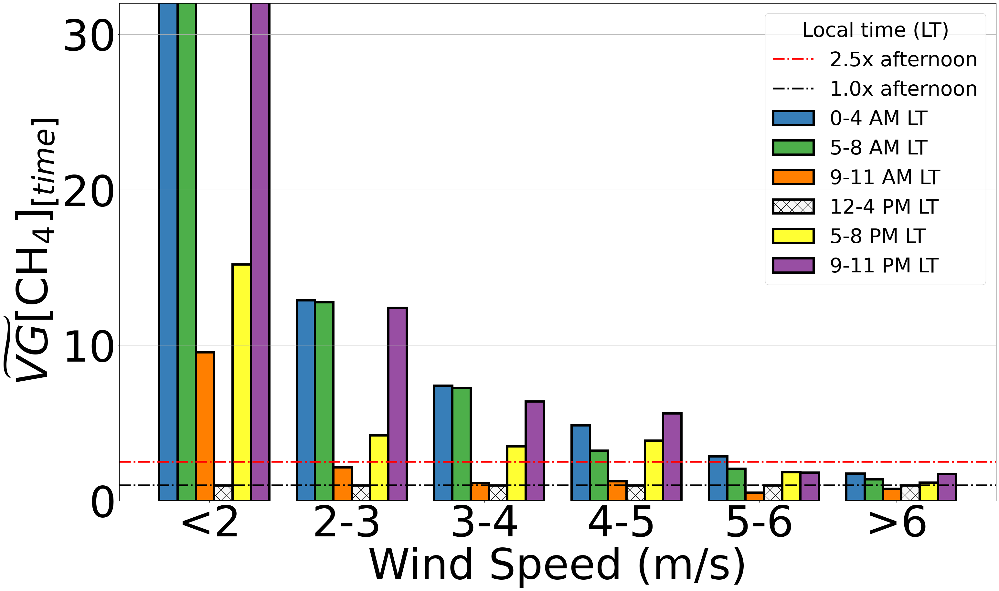

In [23]:
# Figure 3a//S12a
ax1 = fig_vg_norm_time_ws(OUTPUTS['VG_NORM_AFT_DORM_WS'],periods,gas)

(-40.0, 40.0)

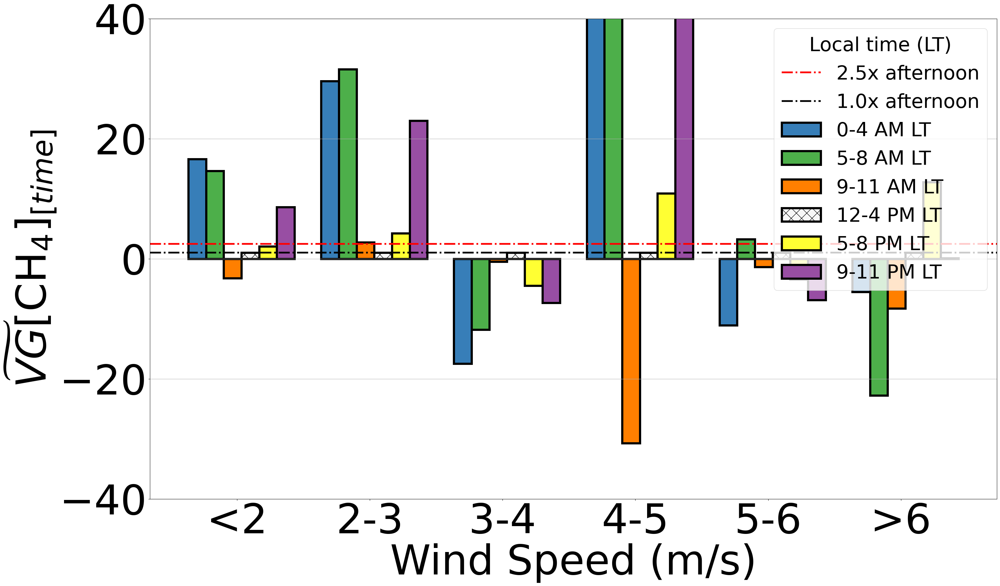

In [24]:
# Figure 3b // S12b
ax2 = fig_vg_norm_time_ws(OUTPUTS['VG_NORM_AFT_GROW_WS'],periods,gas)
ax2.set_ylim(-40,40)

### Figure 3c // 3d 
- 3c: select gas = co2 at the beginning of the code // 3d: select gas = ch4 at the beginning of the code

In [25]:
# Calculate mean by GROUPING BY SEASON, PERIOD OF DAY, AND TKE CATEGORY
temp = OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','TKE_level3_CAT']).mean()
## NORMALIZING VERTICAL GRADIENTS BY MID-AFTERNOON
OUTPUTS['VG_NORM_AFT_DORM_TKE'] = pd.DataFrame(temp['VG']['DORMANT']/temp['VG']['DORMANT']['12-4 PM LT'])
OUTPUTS['VG_NORM_AFT_GROW_TKE'] = pd.DataFrame(temp['VG']['GROWING']/temp['VG']['GROWING']['12-4 PM LT'])

In [26]:
# Uncomment below to view values out of axis range
#OUTPUTS['VG_NORM_AFT_DORM_TKE']
#OUTPUTS['VG_NORM_AFT_GROW_TKE']

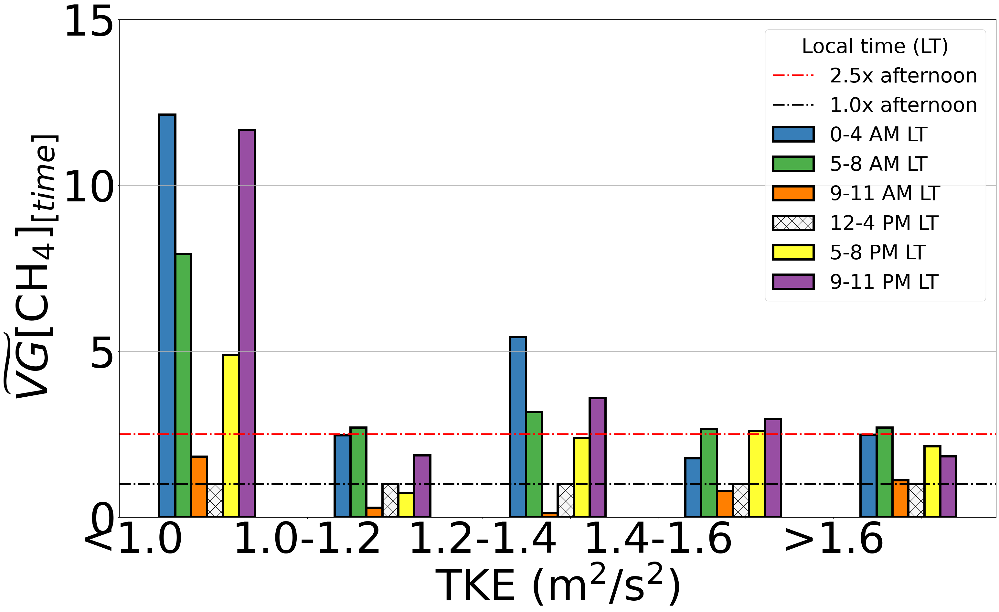

In [27]:
# Figure 3c
ax1 = fig_vg_time_tke(OUTPUTS['VG_NORM_AFT_DORM_TKE'],periods,gas)

## FIGURE 4

Mean vertical gradients normalized by fossil fuel emissions (details can be found in Text S1) and by the normalized mid-afternoon (12:00 to 16:59 LT) vertical gradient (equation 2) and categorized according to observed wind speed (from Indianapolis International Airport) for different time periods of the day, for January and February of 2016. 

In [28]:
# Attribute emissions to periods of the day (as per table S1)
OUTPUTS['VERTICAL_GRAD']['EMISSIONS'] = emissions(OUTPUTS['VERTICAL_GRAD'])
#OUTPUTS['VERTICAL_GRAD']

In [29]:
if gas == 'co2':
    ## GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
    temp = OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean()

    ## NORMALIZING BY EMISSIONS:
    temp['VG_EM'] = temp['VG']/temp['EMISSIONS']


    # NORMALIZING VERTICAL GRADIENTS BY MID-AFTERNOON
    OUTPUTS['VG_NORM_AFT_DORM_EMIS_WS'] = pd.DataFrame(temp['VG_EM']['DORMANT']/temp['VG_EM']['DORMANT']['12-4 PM LT'])
    OUTPUTS['VG_NORM_AFT_GROW_EMIS_WS'] = pd.DataFrame(temp['VG_EM']['GROWING']/temp['VG_EM']['GROWING']['12-4 PM LT'])

#uNCOMMENT BELOW TO SEE THE VALUES OUT OF AXIS RANGE
#OUTPUTS['VG_NORM_AFT_DORM_EMIS_WS'] 

In [30]:
if gas == 'co2':
    #Figure 4
    fig_vg_time_emis_ws(OUTPUTS['VG_NORM_AFT_DORM_EMIS_WS'],periods,gas)

### Figure 4 using TKE (not shown in the manuscript)

In [31]:
if gas == 'co2':
    ## GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
    temp = OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','TKE_level3_CAT']).mean()

    ## NORMALIZING BY EMISSIONS:
    temp['VG_EM'] = temp['VG']/temp['EMISSIONS']


    # NORMALIZING VERTICAL GRADIENTS BY MID-AFTERNOON
    OUTPUTS['VG_NORM_AFT_DORM_EMIS_TKE'] = pd.DataFrame(temp['VG_EM']['DORMANT']/temp['VG_EM']['DORMANT']['12-4 PM LT'])
    OUTPUTS['VG_NORM_AFT_GROW_EMIS_TKE'] = pd.DataFrame(temp['VG_EM']['GROWING']/temp['VG_EM']['GROWING']['12-4 PM LT'])

#uNCOMMENT BELOW TO SEE THE VALUES OUT OF AXIS RANGE
#OUTPUTS['VG_NORM_AFT_DORM_EMIS_WS'] 

In [32]:
if gas == 'co2':
    fig_vg_time_emis_tke(OUTPUTS['VG_NORM_AFT_DORM_EMIS_TKE'],periods,gas)

## FIGURE 5 // FIGURE S11

* FIGURE 5: Mean boundary layer depth (BLD) bias (mean mismatch between hourly modeled and observed BLD) for different time ranges shown at local time (LT), categorized by wind speed classes, for January and February 2016.


* FIGURE S11: Growing season: mean vertical gradients categorized according to observed wind speed (Indianapolis International Airport) for different time periods of the day, for May, June, and July 2016. (a) vertical gradients of CO2; (b) vertical gradients of CH4.


In [33]:
## Calculate mean by GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
DATA['ABL_WS'] = pd.DataFrame(DATA['ABL'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean())

In [34]:
#Uncomment to show values out of axis range
#DATA['ABL_WS']['R_Error(%)']['GROWING']

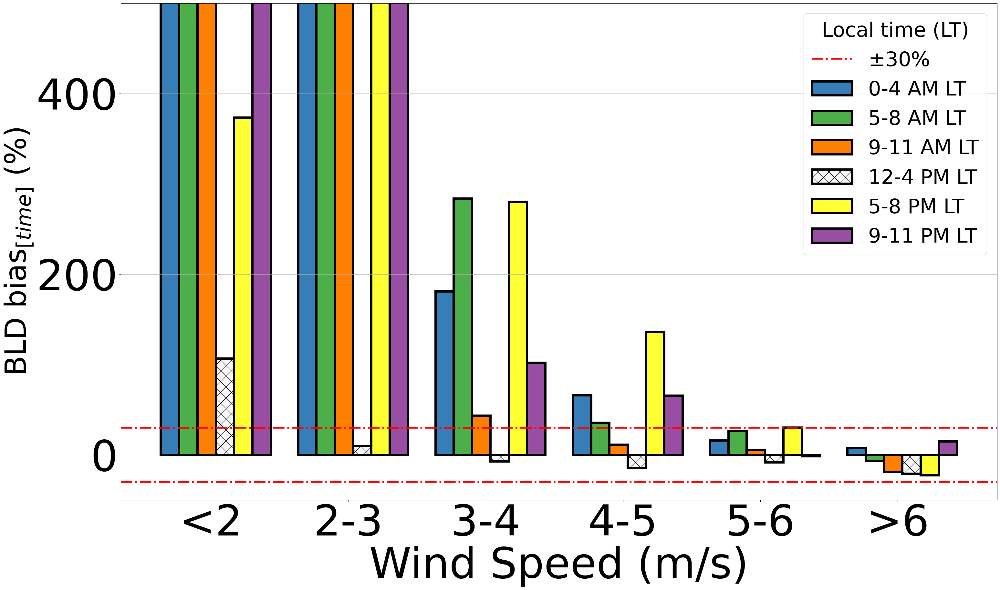

In [35]:
# Figure 5
ax1 = fig_bld_RBias(DATA['ABL_WS']['R_Error(%)']['DORMANT'],periods,gas)

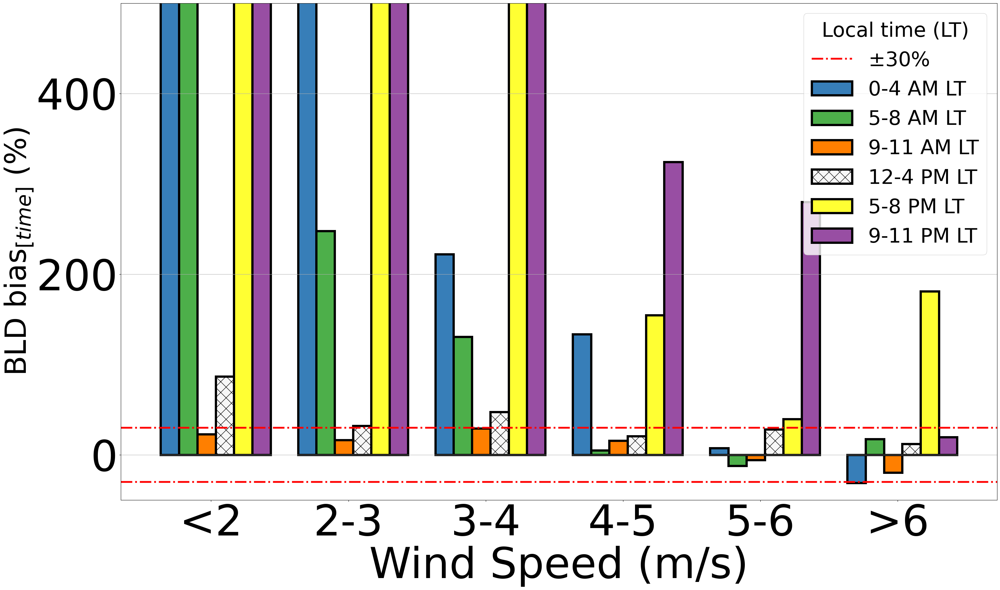

In [36]:
# Figure S11
ax2 = fig_bld_RBias(DATA['ABL_WS']['R_Error(%)']['GROWING'],periods,gas)

### Figure 5 using TKE (not shown in the manuscript)

In [37]:
## Calculating mean by GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
DATA['ABL_TKE'] = pd.DataFrame(DATA['ABL'].groupby(['SEASON','PERIOD','TKE_level3_CAT']).mean())
DATA['ABL_DORM_TKE'] = pd.DataFrame(DATA['ABL_TKE']['R_Error(%)']['DORMANT'])
DATA['ABL_GROW_TKE'] = pd.DataFrame(DATA['ABL_TKE']['R_Error(%)']['GROWING'])

<Axes: xlabel='TKE (m$^2$/s$^2$)', ylabel='BLD bias$_{[time]}$ (%)'>

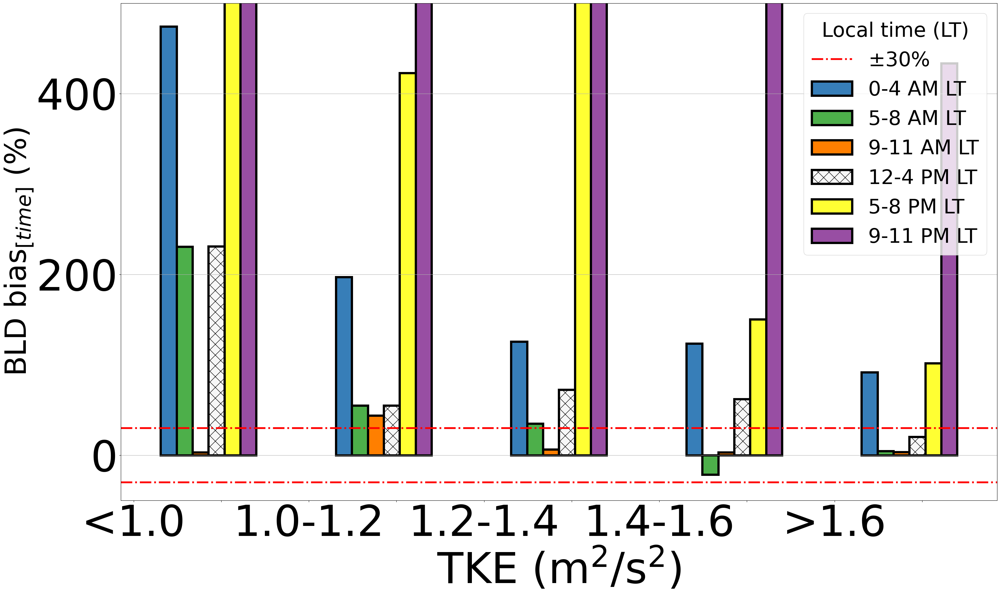

In [38]:
fig_bld_RBias_tke(DATA['ABL_GROW_TKE'],periods,gas)

## FIGURE 6 // FIGURE S13
* Figure 6: Mean CO2 enhancement for January and February 2016. (a)  Observed enhancements (CO2xs obs). (b) Modeled enhancements (CO2xs model). (c) Observed enhancement normalized by fossil fuel emissions and observed boundary layer depth. (d)  Modeled enhancements normalized by fossil fuel emissions and modeled boundary layer depth.

* Figure S13: Growing season: mean CO2 enhancement for May, June, and July 2016. (a) Observed enhancement normalized by fossil fuel emissions and observed boundary layer depth. (b)  Modeled enhancements normalized by fossil fuel emissions and modeled boundary layer depth.

In [39]:
if gas == 'co2':
    ## Calculate mean by GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
    OUTPUTS['ENHANCEMENT_WS'] = pd.DataFrame(OUTPUTS['ENHANCEMENT'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean())

### Figure 6a

In [40]:
if gas == 'co2':
    ax1 = fig_xs_ws(OUTPUTS['ENHANCEMENT_WS']['XS']['DORMANT'],'XS',periods,gas)
    #ax1.get_legend().remove()

### Figure 6b

In [41]:
if gas == 'co2':
    ax1 = fig_xs_ws(OUTPUTS['ENHANCEMENT_WS']['XS_MODEL']['DORMANT'],'XS_MODEL',periods,gas)
    #ax1.get_legend().remove()

### Figure 6c // 6d // S13a// S13b

In [42]:
if gas == 'co2':
    # Attribute emissions to periods of the day
    OUTPUTS['ENHANCEMENT']['EMISSIONS'] = emissions(OUTPUTS['ENHANCEMENT'])
    # Normalize Hourly enhancement by fossil fuel (average for the period of the day) and hourly boundary layer depth
    # Observed 
    OUTPUTS['ENHANCEMENT']['XS_FF_BLD'] = OUTPUTS['ENHANCEMENT']['XS']/OUTPUTS['ENHANCEMENT']['EMISSIONS']/OUTPUTS['ENHANCEMENT']['ABL_Lidar']   
    # Modelled
    OUTPUTS['ENHANCEMENT']['XSModel_FF_BLD'] = OUTPUTS['ENHANCEMENT']['XS_MODEL']/OUTPUTS['ENHANCEMENT']['EMISSIONS']/OUTPUTS['ENHANCEMENT']['ABL_Model']   

In [43]:
if gas == 'co2':
    # Calculate the mean for the each season, period, and 
    #wind speed category 
    OUTPUTS['ENHANCEMENT_NORM_WS'] = pd.DataFrame(OUTPUTS['ENHANCEMENT'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean())
    #tke category
    OUTPUTS['ENHANCEMENT_NORM_TKE'] = pd.DataFrame(OUTPUTS['ENHANCEMENT'].groupby(['SEASON','PERIOD','TKE_level3_CAT']).mean())

In [44]:
if gas == 'co2':
    # FIGURE 6c 
    ax1 = fig_xs_ws(OUTPUTS['ENHANCEMENT_NORM_WS']['XS_FF_BLD']['DORMANT'], 'XS_FF_BLD', periods,gas)
    #ax1.get_legend().remove()

In [45]:
if gas == 'co2':
    # For figure S13a 
    ax2 = fig_xs_ws(OUTPUTS['ENHANCEMENT_NORM_WS']['XS_FF_BLD']['GROWING'], 'XS_FF_BLD', periods,gas)
    #ax2.get_legend().remove()

In [46]:
if gas == 'co2':
    # FIGURE 6d 
    ax1 = fig_xs_ws(OUTPUTS['ENHANCEMENT_NORM_WS']['XSModel_FF_BLD']['DORMANT'], 'XSModel_FF_BLD', periods,gas)
    #ax1.get_legend().remove()

In [47]:
if gas == 'co2':
    # Figure S13b 
    ax2 = fig_xs_ws(OUTPUTS['ENHANCEMENT_NORM_WS']['XSModel_FF_BLD']['GROWING'], 'XSModel_FF_BLD', periods,gas)
    #ax2.get_legend().remove()

### Figure 6 using TKE (not shown in the manuscript)

In [48]:
if gas == 'co2':
    ax1 = fig_xs_tke(OUTPUTS['ENHANCEMENT_NORM_TKE']['XS_FF_BLD']['DORMANT'], 'XS_FF_BLD', periods,gas)
    #ax2 = fig_xs_tke(OUTPUTS['ENHANCEMENT_NORM_TKE']['XS_FF_BLD']['GROWING'], 'XS_FF_BLD', periods,gas)

In [49]:
if gas == 'co2':
    ax1 = fig_xs_tke(OUTPUTS['ENHANCEMENT_NORM_TKE']['XSModel_FF_BLD']['DORMANT'], 'XSModel_FF_BLD', periods,gas)
    #ax2 = fig_xs_tke(OUTPUTS['ENHANCEMENT_NORM_TKE']['XSModel_FF_BLD']['GROWING'], 'XSModel_FF_BLD', periods,gas)

## TABLE 2
CO2 enhancement mean, mean absolute error (MAE), and bias from all conditions, for atmospheric conditions when wind speed is smaller than 5 m/s, and greater than or equal to 5 m/s. All times are in local time = UTC-5. * The mean refers to the observed CO2 enhancement.

In [50]:
# CO2 ENHANCEMENT FOR ALL WIND CONDITIONS
if gas == 'co2':
    temp = OUTPUTS['ENHANCEMENT'].loc[OUTPUTS['ENHANCEMENT']['SEASON'] == 'DORMANT']
    df_table = table_mae_bias(temp, 'XS', 'XS_MODEL', periods)
    print(df_table)

In [51]:
# CO2 ENHANCEMENT FOR ALL WIND SPEED < 5 m/s *wsp category < 4
if gas == 'co2':
    temp = OUTPUTS['ENHANCEMENT'].loc[(OUTPUTS['ENHANCEMENT']['SEASON'] == 'DORMANT')&
                                      (OUTPUTS['ENHANCEMENT']['WS_OBS_CAT'] < 4)]
    df_table = table_mae_bias(temp, 'XS', 'XS_MODEL', periods)
    print(df_table)

In [52]:
# CO2 ENHANCEMENT FOR ALL WIND SPEED >= 5 m/s *wsp category >= 4
if gas == 'co2':   
    temp = OUTPUTS['ENHANCEMENT'].loc[(OUTPUTS['ENHANCEMENT']['SEASON'] == 'DORMANT')&
                                      (OUTPUTS['ENHANCEMENT']['WS_OBS_CAT'] >= 4)]
    df_table = table_mae_bias(temp, 'XS', 'XS_MODEL', periods)
    print(df_table)

# FIGURE 7 // FIGURE S14

Absolute mean of hourly observed CO2 enhancement (Site 02 - background) normalized by CO2 vertical differences (Site 02) for January and February of 2016. (a) Wind speed < 5 m/s. (b) Wind speed ≥ 5 m/s. In (b) the scale is cut-off at 10; the morning (09:00-11:59 LT) averaged ratio between CO2xsobs and CO2diff is ~17. Note that this large difference might be due to rapid changes in VGs during these hours of the day. Error bars are the standard error of the mean. Hours are in local time. Using Site 02 inlet height 40 mAGL, background is either Site 01 (inlet height 121 mAGL) or Site 09 (inlet height 130 mAGL). Site 01 was adopted when air masses were coming from 180 – 360 degrees, and Site 09, otherwise.

In [53]:
if gas == 'co2':
    #MERGE enhancements df with vertical differences 
    OUTPUTS['ENHANCEMENT'] = pd.merge(OUTPUTS['ENHANCEMENT'],OUTPUTS['VERTICAL_GRAD']['VERT_DIFF'],left_index=True, right_index=True, how = 'inner')
    # Calculate the ratio enhancement/vertical difference:
    OUTPUTS['ENHANCEMENT']['XS_VDIFF'] =(OUTPUTS['ENHANCEMENT']['XS']/abs(OUTPUTS['ENHANCEMENT']['VERT_DIFF']))
    # Replace infinite by NaN
    OUTPUTS['ENHANCEMENT']['XS_VDIFF'].replace([np.inf, -np.inf], np.nan, inplace=True)

In [54]:
if gas == 'co2':
    #Calculate mean and standard error (sem) of ratio enhancement/vertical difference for
    # wind speed < 5 m/s (equivalent to wsp category 0 to 3 as defined at the beginning of the code)
    temp = OUTPUTS['ENHANCEMENT'].loc[OUTPUTS['ENHANCEMENT']['WS_OBS_CAT']<4]
    OUTPUTS['ENHANCEMENT_l5'] = pd.DataFrame(temp.groupby(['SEASON','PERIOD']).mean())
    OUTPUTS['ENHANCEMENT_l5_sem'] = pd.DataFrame(temp.groupby(['SEASON','PERIOD']).sem())

In [55]:
if gas == 'co2':
    #Calculate mean and standard error (sem) of ratio enhancement/vertical difference for
    # wind speed >= 5 m/s (equivalent to wsp category >=4 as defined at the beginning of the code)
    temp = OUTPUTS['ENHANCEMENT'].loc[OUTPUTS['ENHANCEMENT']['WS_OBS_CAT']>=4]
    OUTPUTS['ENHANCEMENT_g5'] = pd.DataFrame(temp.groupby(['SEASON','PERIOD']).mean())
    OUTPUTS['ENHANCEMENT_g5_sem'] = pd.DataFrame(temp.groupby(['SEASON','PERIOD']).sem())

### Figure 7a // Figure S14a

In [56]:
if gas == 'co2':
    # Sorting outputs (to display ordered period)
    ENHANCEMENT_DORM_l5 = pd.DataFrame(OUTPUTS['ENHANCEMENT_l5']['XS_VDIFF']['DORMANT']).reindex(periods)
    ENHANCEMENT_DORM_l5_sem = pd.DataFrame(OUTPUTS['ENHANCEMENT_l5_sem']['XS_VDIFF']['DORMANT']).reindex(periods)
    ENHANCEMENT_GROW_l5 = pd.DataFrame(OUTPUTS['ENHANCEMENT_l5']['XS_VDIFF']['GROWING']).reindex(periods)
    ENHANCEMENT_GROW_l5_sem = pd.DataFrame(OUTPUTS['ENHANCEMENT_l5_sem']['XS_VDIFF']['GROWING']).reindex(periods)

In [57]:
if gas == 'co2':
    # Figure 7a
    ax1 = fig_xs_diff(ENHANCEMENT_DORM_l5['XS_VDIFF'],ENHANCEMENT_DORM_l5_sem['XS_VDIFF'], periods,gas)

In [58]:
if gas == 'co2':
    # Figure S14a
    ax2 = fig_xs_diff(ENHANCEMENT_GROW_l5['XS_VDIFF'],ENHANCEMENT_GROW_l5_sem['XS_VDIFF'], periods,gas)

### Figure 7b // Figure S14b

In [59]:
if gas == 'co2':
    # Sorting outputs
    ENHANCEMENT_DORM_g5 = pd.DataFrame(OUTPUTS['ENHANCEMENT_g5']['XS_VDIFF']['DORMANT']).reindex(periods)
    ENHANCEMENT_DORM_g5_sem = pd.DataFrame(OUTPUTS['ENHANCEMENT_g5_sem']['XS_VDIFF']['DORMANT']).reindex(periods)
    ENHANCEMENT_GROW_g5 = pd.DataFrame(OUTPUTS['ENHANCEMENT_g5']['XS_VDIFF']['GROWING']).reindex(periods)
    ENHANCEMENT_GROW_g5_sem = pd.DataFrame(OUTPUTS['ENHANCEMENT_g5_sem']['XS_VDIFF']['GROWING']).reindex(periods)

In [60]:
if gas == 'co2':
    # Figure 7b
    ax1 = fig_xs_diff(ENHANCEMENT_DORM_g5['XS_VDIFF'],ENHANCEMENT_DORM_g5_sem['XS_VDIFF'], periods,gas)

In [61]:
if gas == 'co2':
    # Figure S14b
    ax2 = fig_xs_diff(ENHANCEMENT_GROW_g5['XS_VDIFF'],ENHANCEMENT_GROW_g5_sem['XS_VDIFF'], periods,gas)

## FIGURE 8
Data fraction from the total 24 hours of measurements by period of time using wind speed criteria. Baseline is mid-afternoon hours (12:00 – 16:59  LT) for all wind  conditions (excluding calm wind). 

In [62]:
cities_list, wsp_all = read_wsp_cities(path_airports)
print(cities_list)

['BOS', 'BWI', 'CYYZ', 'EDDM', 'EHRD', 'IAD', 'IND', 'LAX', 'LFPG', 'LFQA', 'LSZH', 'NZAA', 'RJAA', 'SBGR', 'SLC', 'WIII', 'YMML', 'ZBAD']


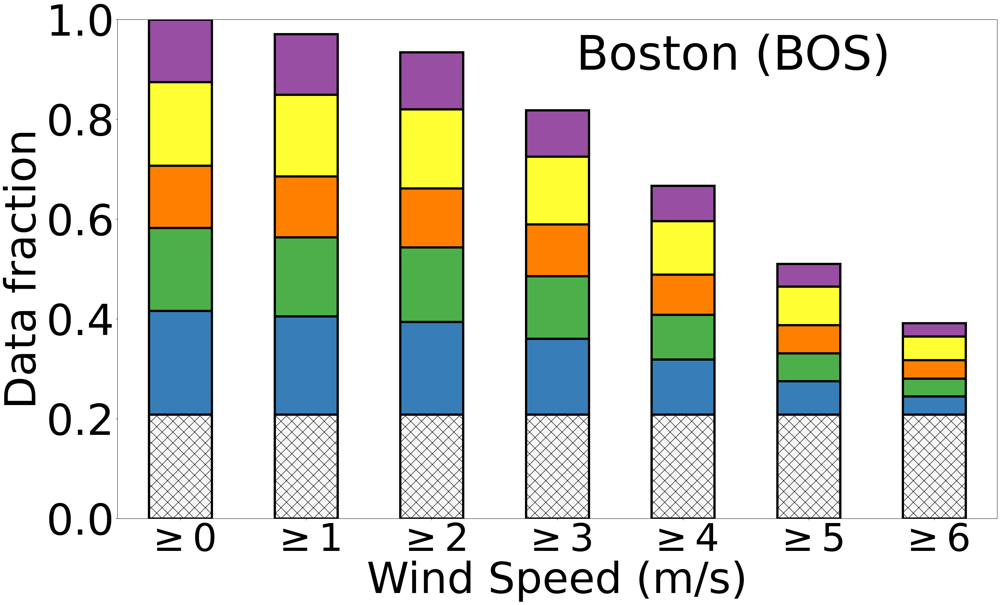

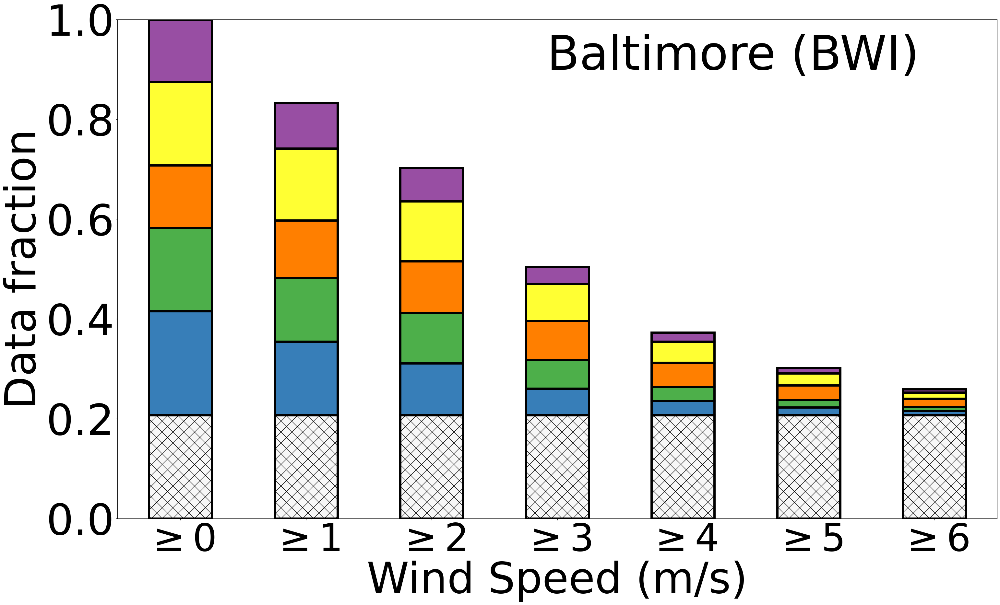

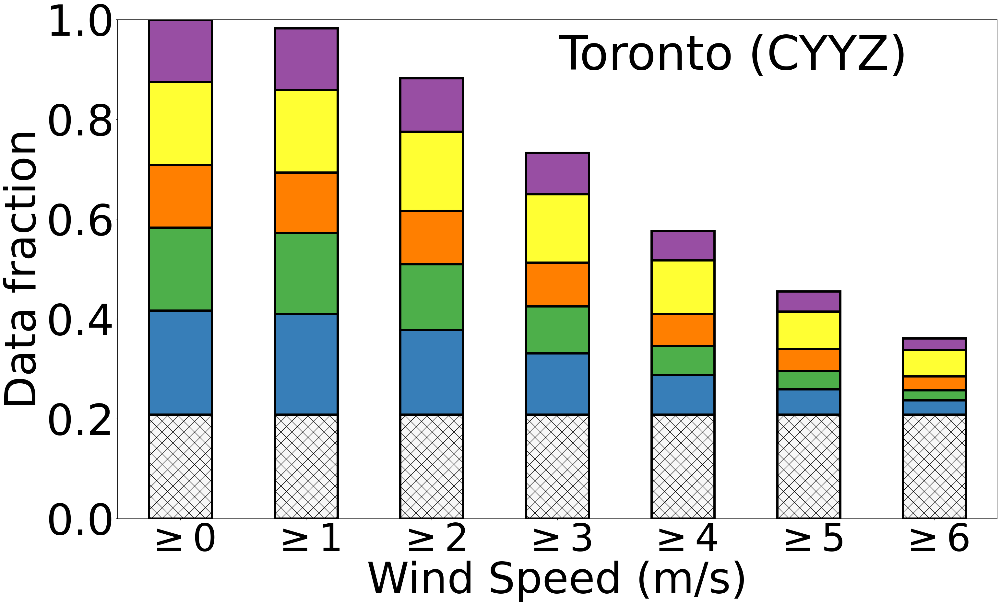

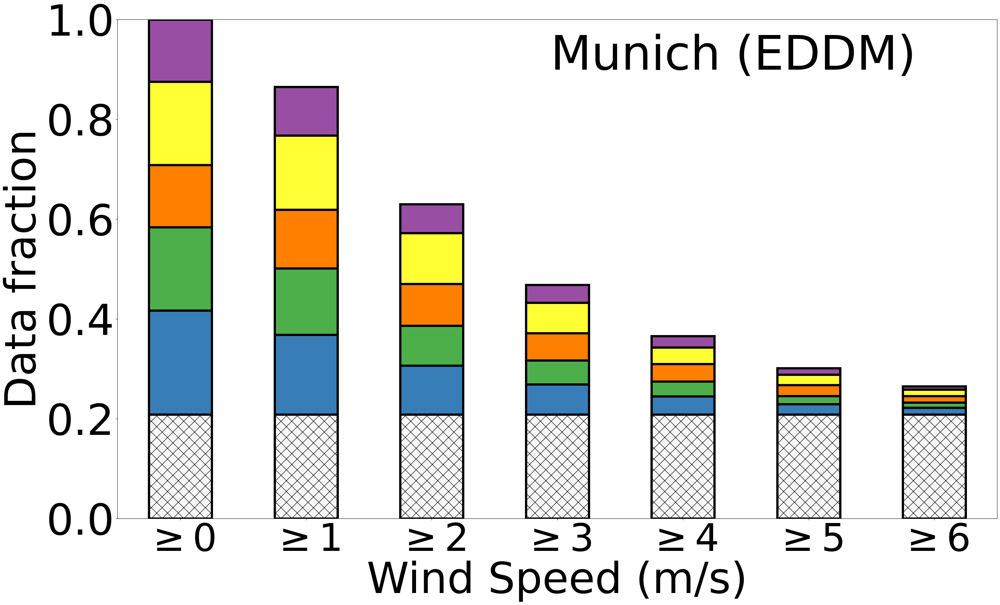

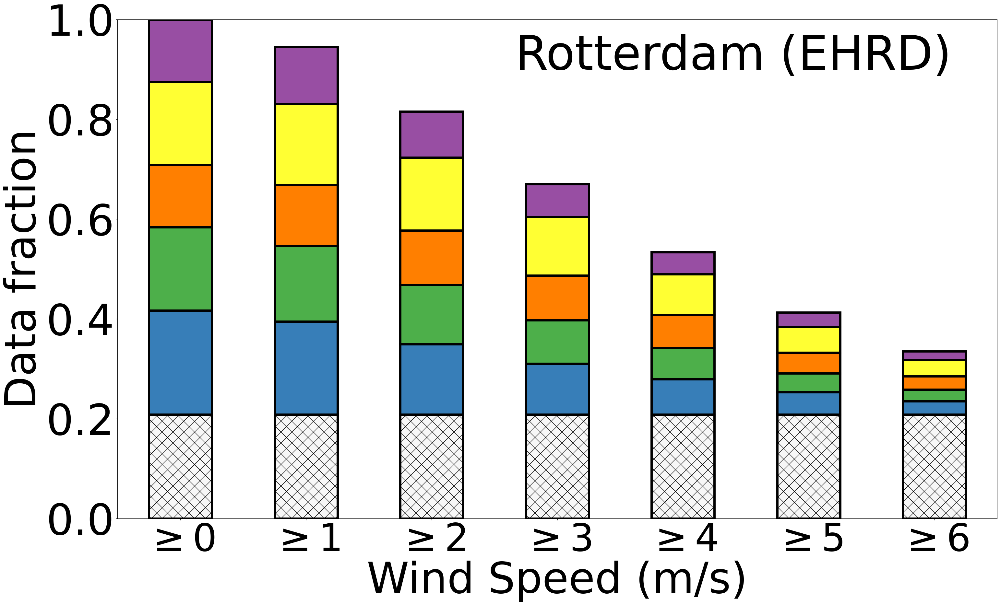

...

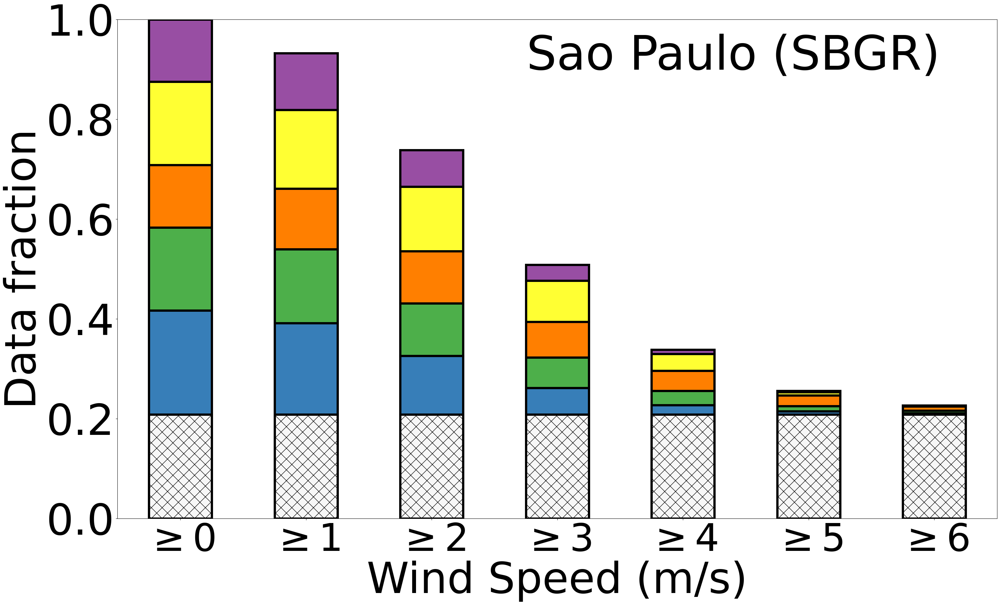

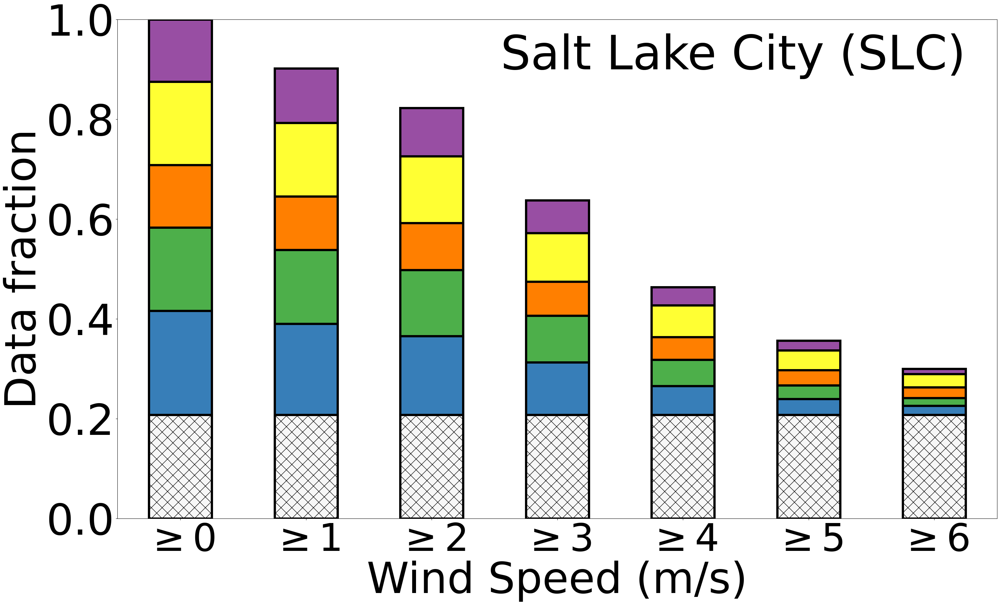

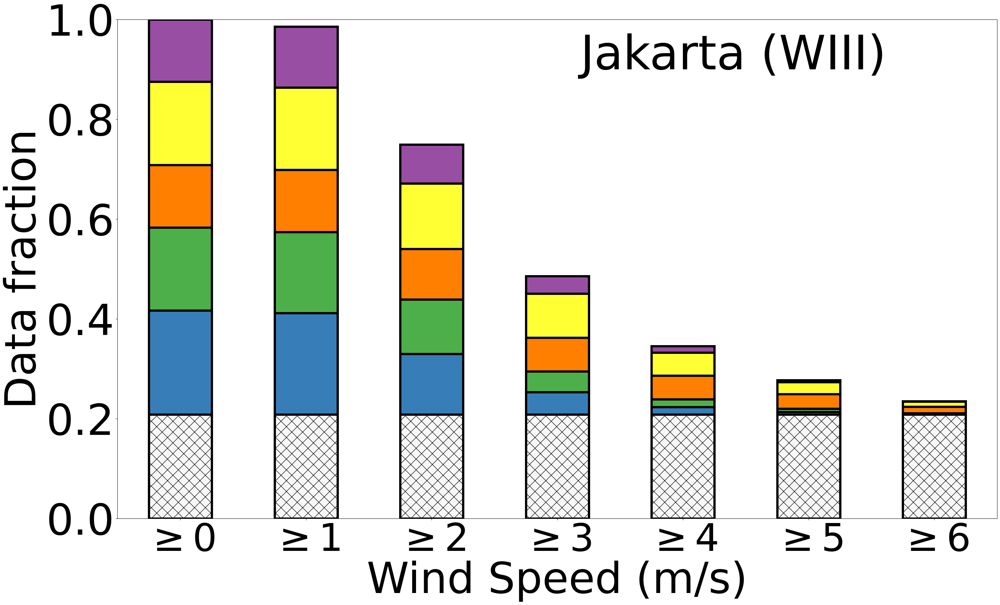

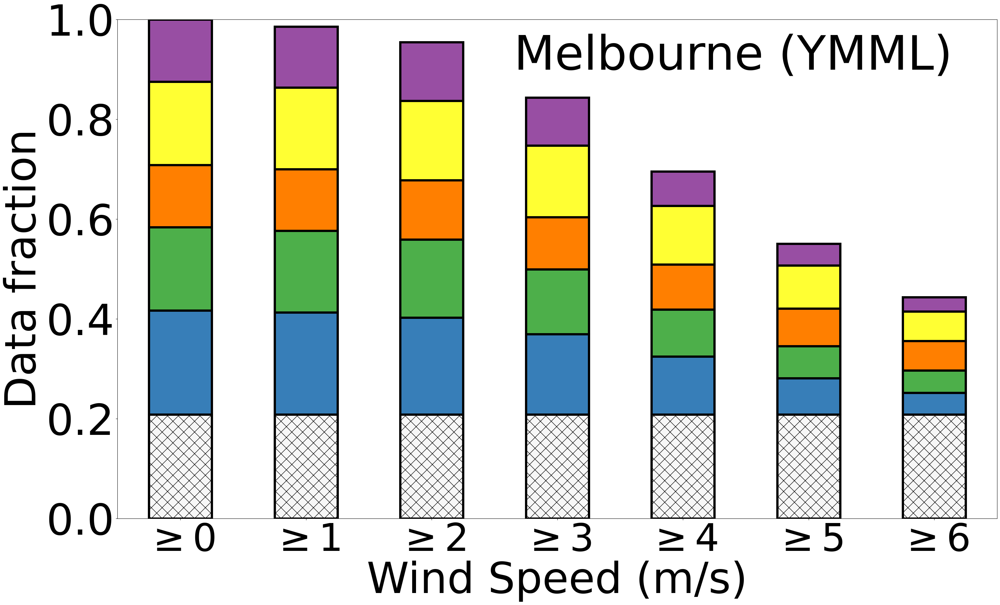

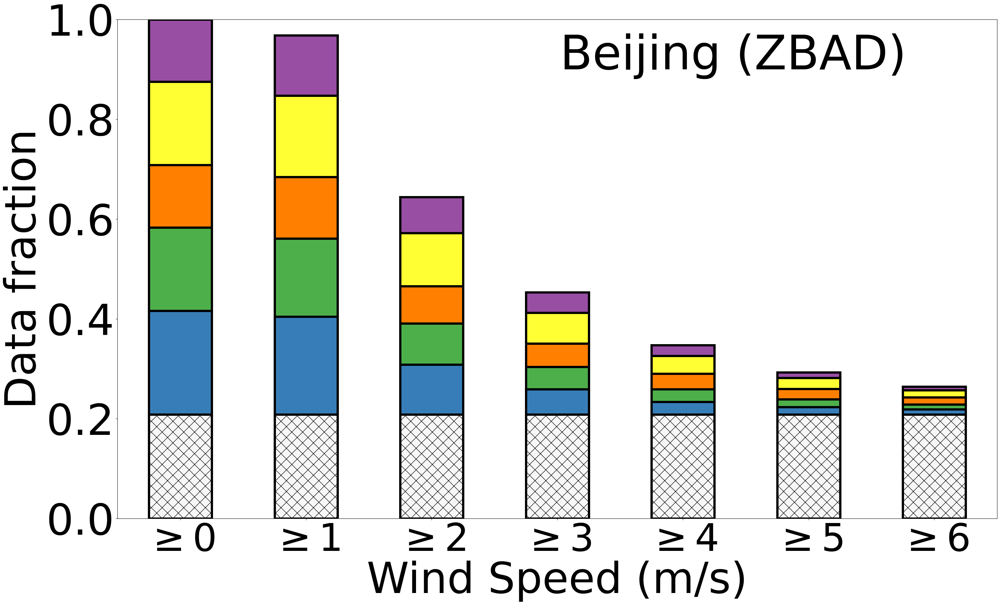

In [63]:
# ax: plot figures for each city 
# Note that the manuscript only shows Indianapolis for 2016, and below it's shown for year 2021
# ws_all : dictionaty storing all individual wind speed dataframes for each city
ax,ws_all_split = wind_by_cities(cities_list,wsp_all) 

## FIGURE 9

Data fraction that will be added into inversion models for different cities when wind speed is ≥ 5m/s, on top of the data fraction typically used on inverse systems (mid-afternoon) when removing calm winds (≤ 2m/s). This is based on 2021 wind speed datasets from the international airports as a representation of wind conditions in the cities where there is a greenhouse gas network in place. Indianapolis is used as a reference, and the other cities are sorted by largest to smallest data fraction.

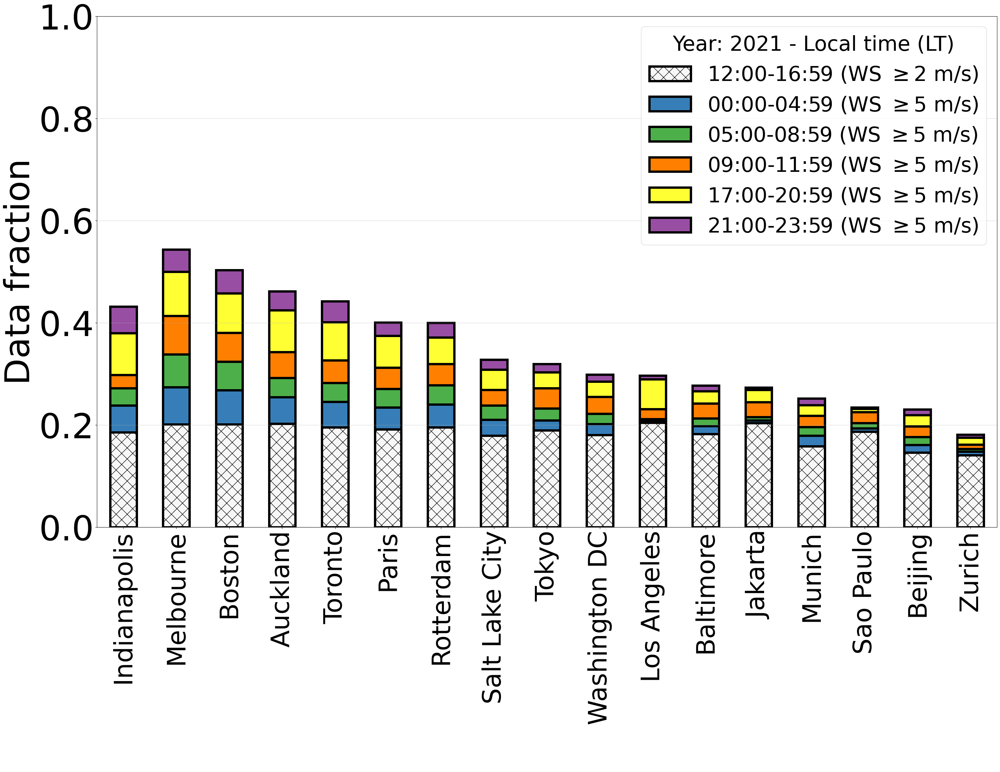

In [64]:
# ws_all : dictionaty storing all individual wind speed dataframes for each city split by categories
ax = all_cities(ws_all_split)

# SUPPORTING INFORMATION

## FIGURE S1 // FIGURE S9

* Figure S1: Dormant season (for January and February 2016): modeled (WRF) and observed wind speed (Indianapolis International Airport) at 10 mAGL for different hours of the day and respective r2, for January and February 2016. (a) 00:00 - 04:59 LT, (b) 05:00 - 08:59 LT, (c) 09:00 - 11:59 LT, (d) 12:00 - 16:59 LT, (e) 17:00 - 20:59 LT, (f) 21:00 - 23:59 LT.

* Figure S9: Growing season: modeled (WRF) and observed wind speed (Indianapolis International Airport) at 10 mAGL for different hours of the day and respective r2, for May, June, and July 2016. (a) 00:00 - 04:59 LT, (b) 05:00 - 08:59 LT, (c) 09:00 - 11:59 LT, (d) 12:00 - 16:59 LT, (e) 17:00 - 20:59 LT, (f) 21:00 - 23:59 LT.

0-4 AM LT : y= 0.68 x + 0.5
5-8 AM LT : y= 0.64 x + 0.84
9-11 AM LT : y= 0.65 x + 1.09
12-4 PM LT : y= 0.67 x + 1.16
5-8 PM LT : y= 0.68 x + 0.56
9-11 PM LT : y= 0.73 x + 0.32


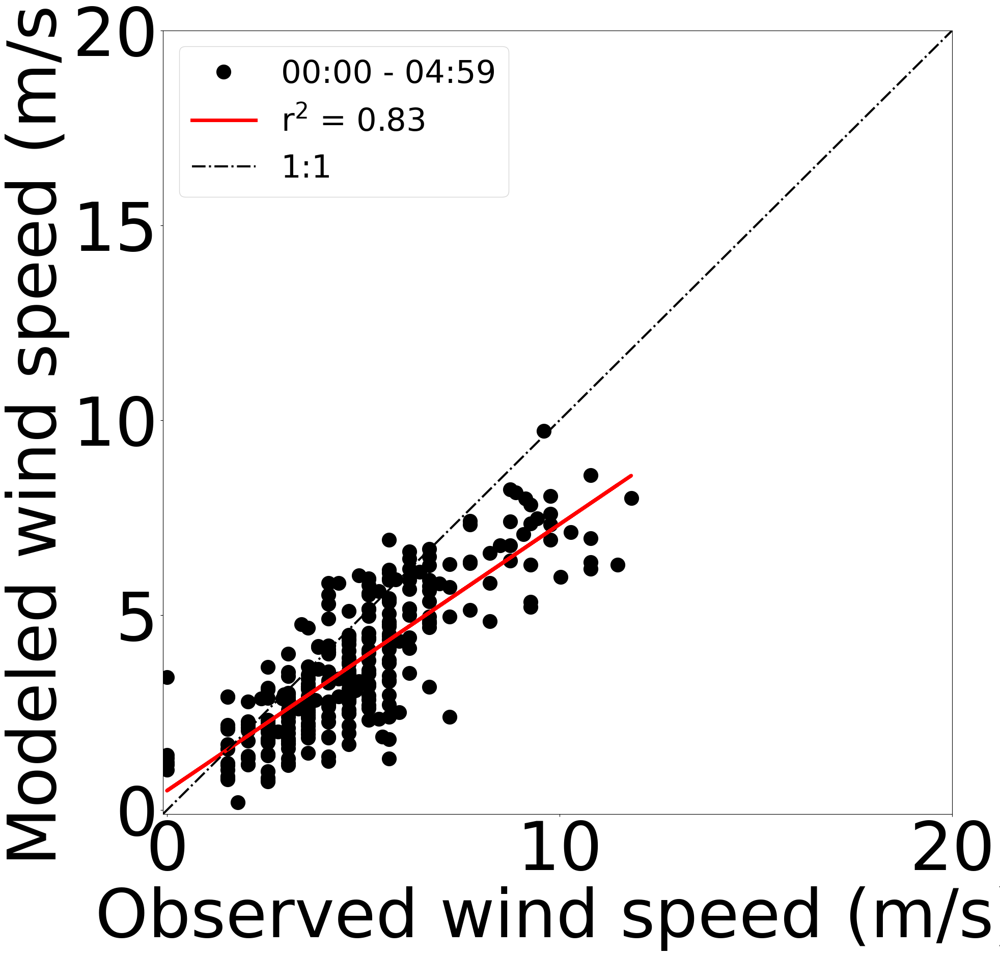

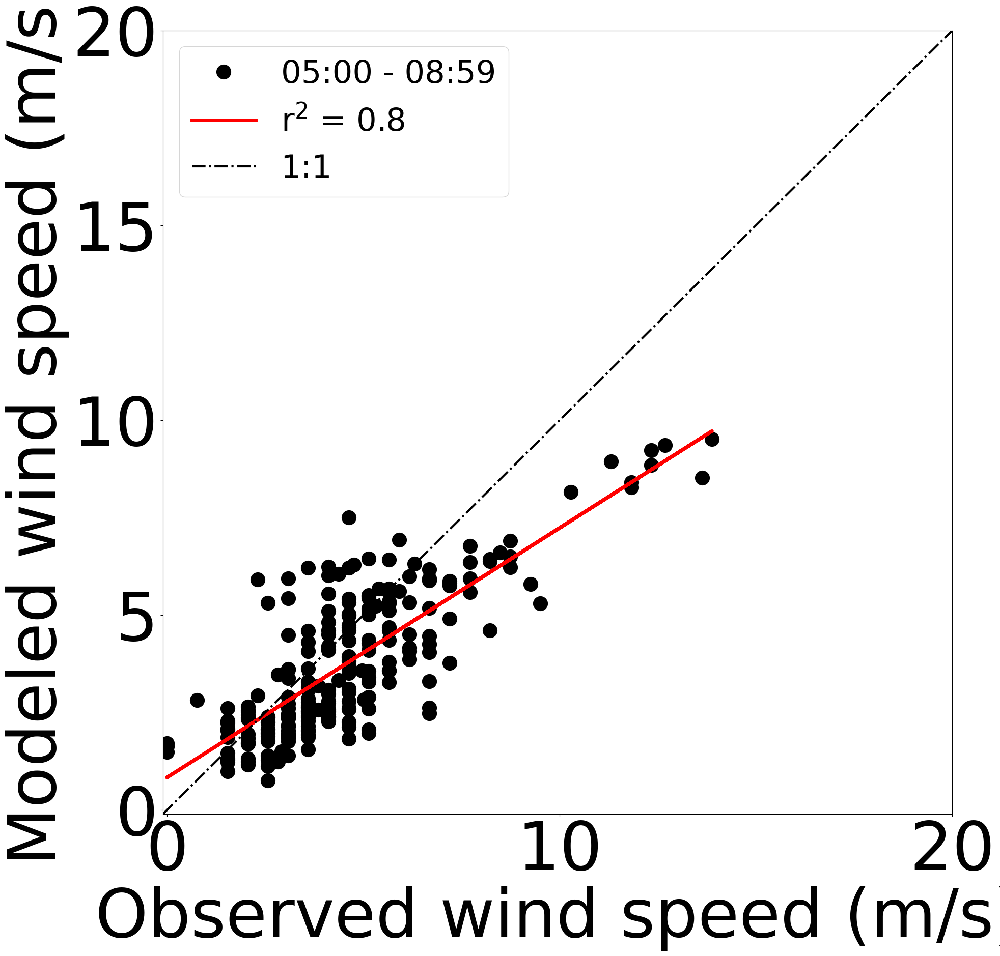

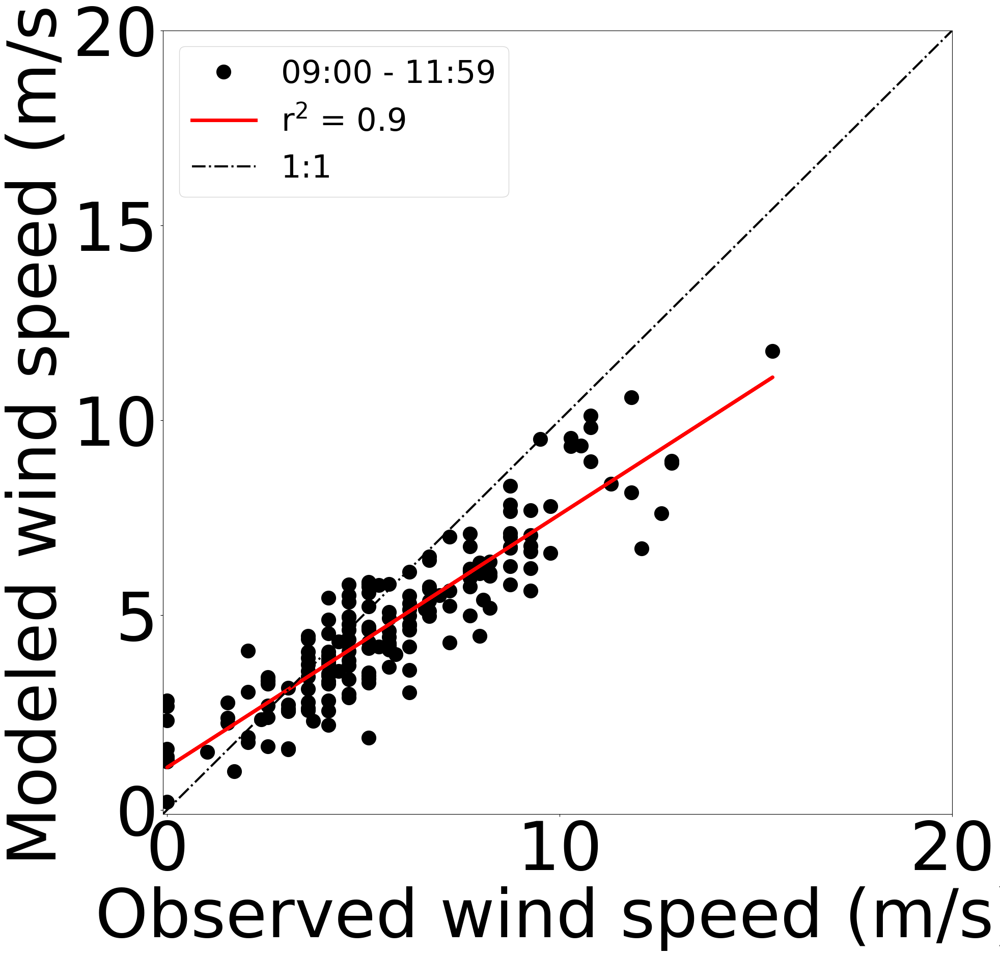

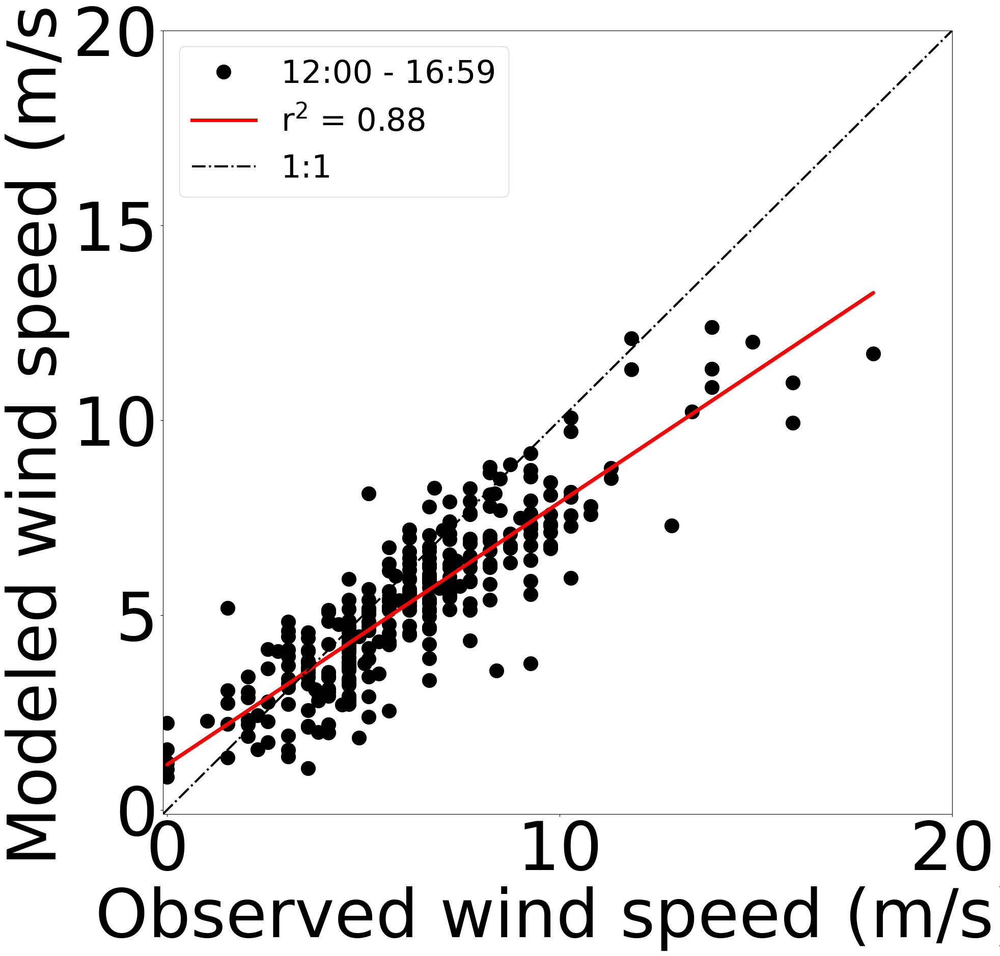

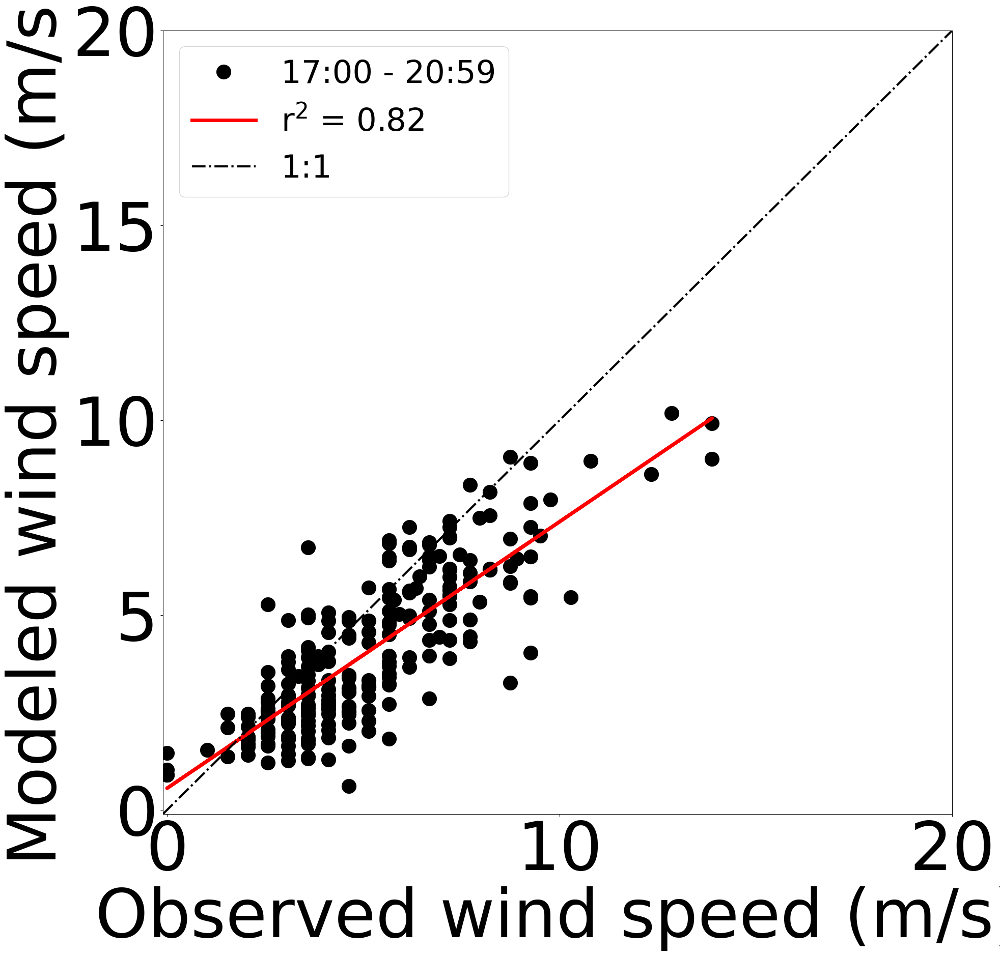

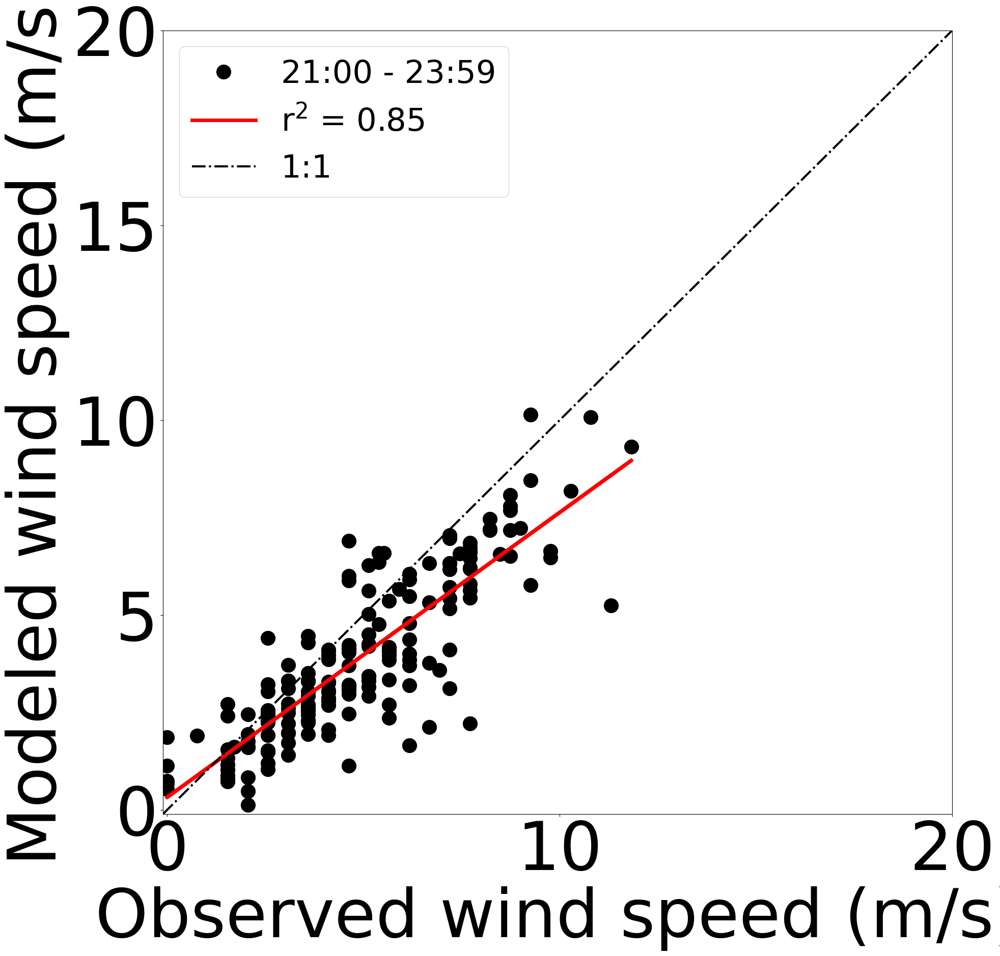

In [65]:
#Figure S1:
ax1 = ws_mod_ob(DATA['WSP'],'DORMANT')

0-4 AM LT : y= 0.36 x + 0.96
5-8 AM LT : y= 0.53 x + 0.51
9-11 AM LT : y= 0.58 x + 0.88
12-4 PM LT : y= 0.54 x + 1.23
5-8 PM LT : y= 0.48 x + 1.05
9-11 PM LT : y= 0.28 x + 1.41


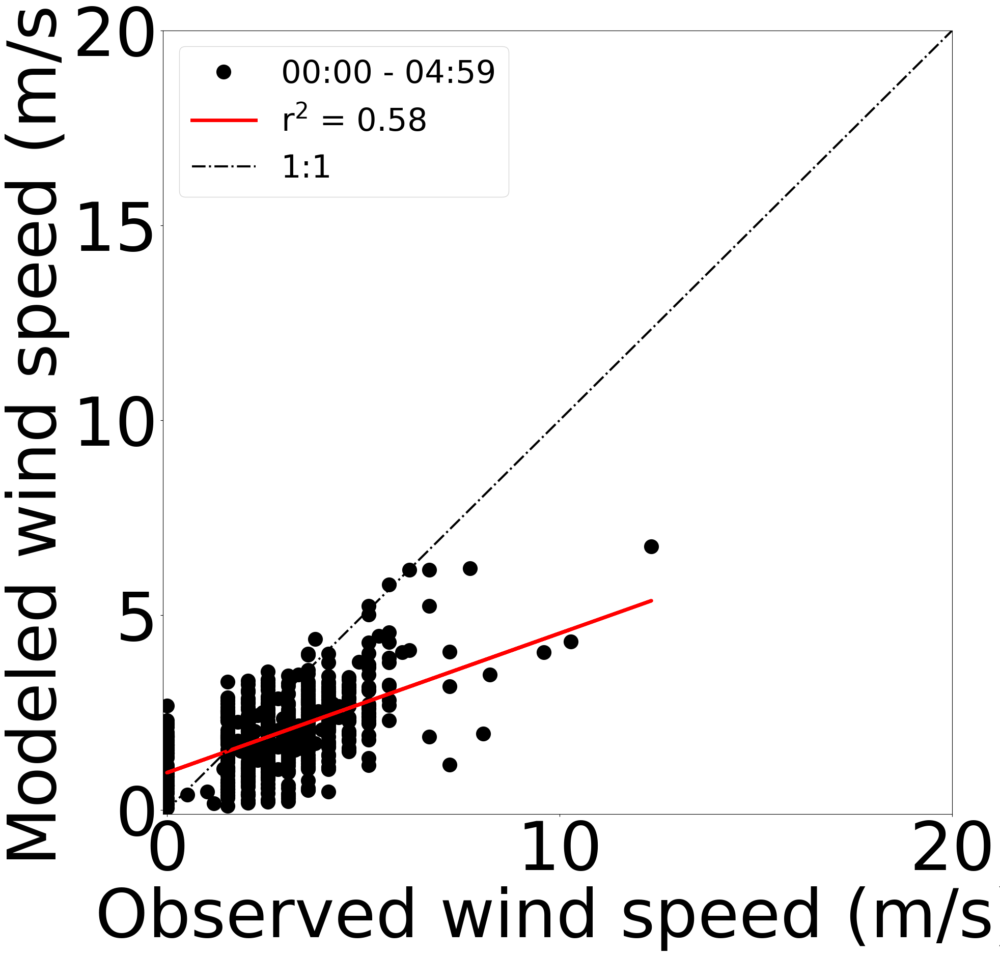

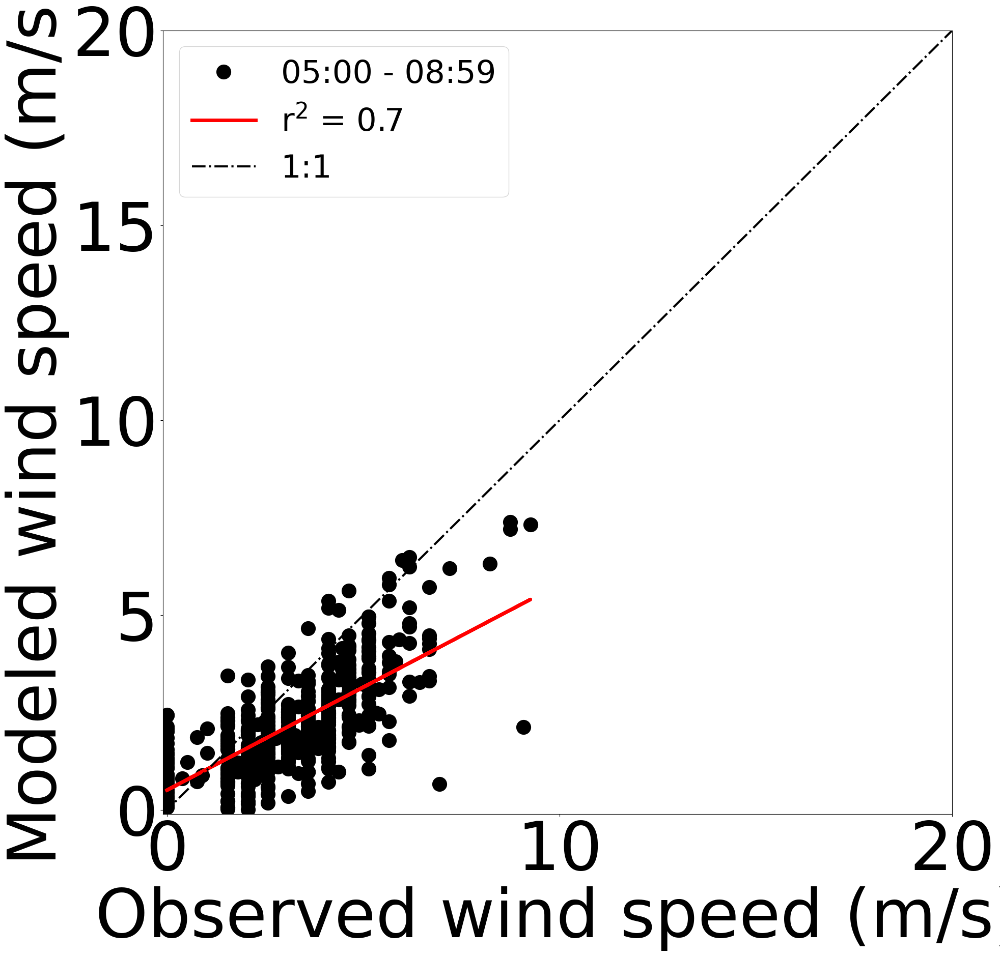

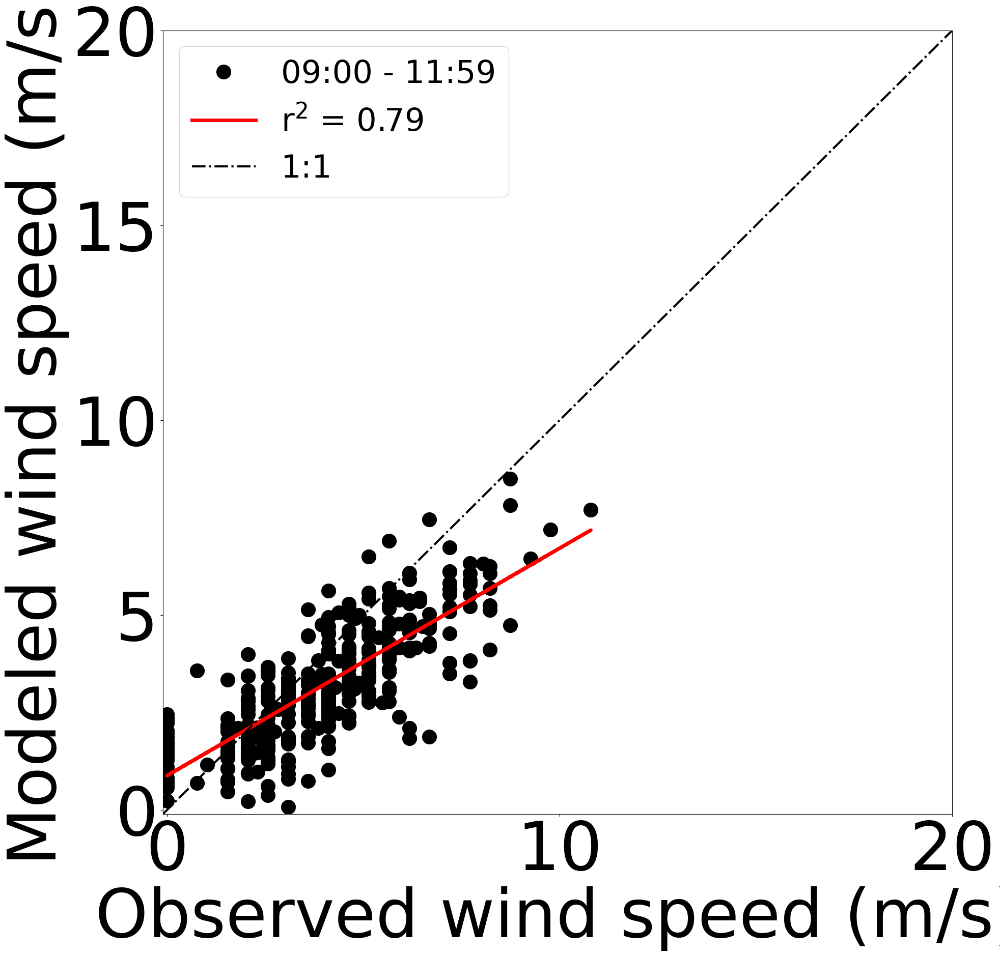

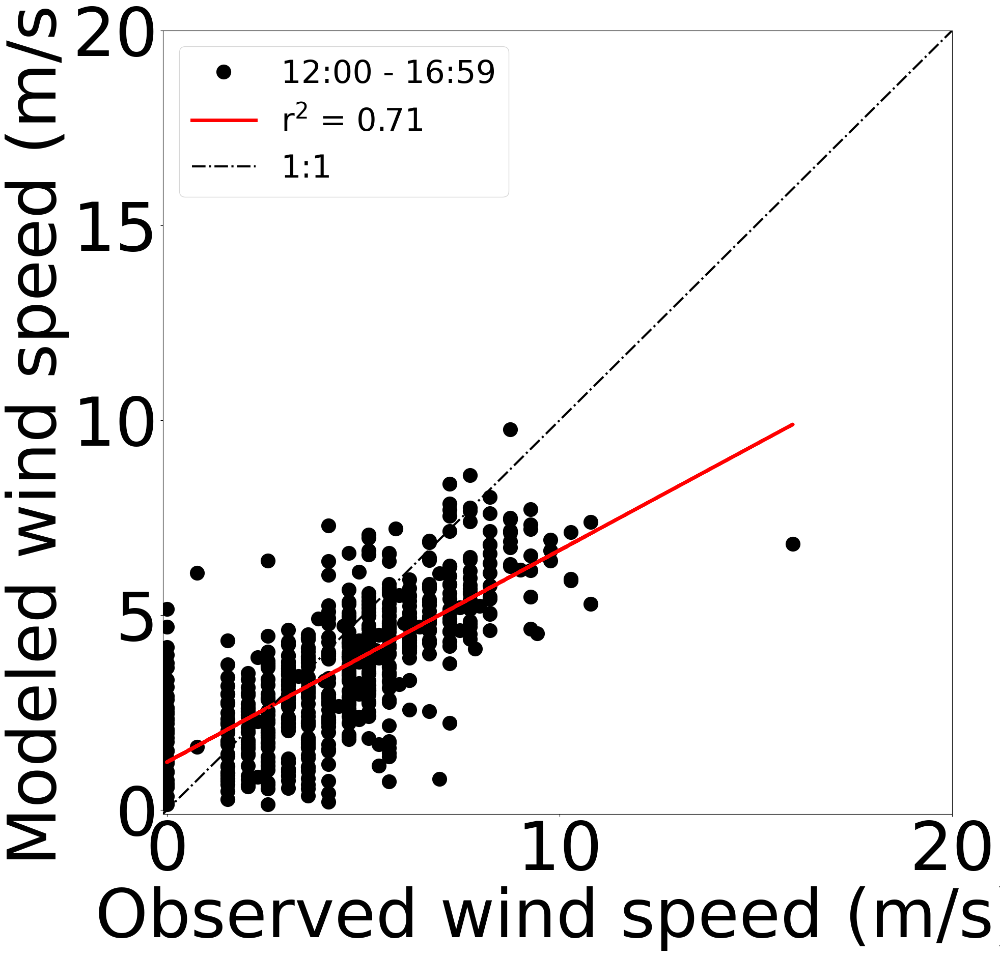

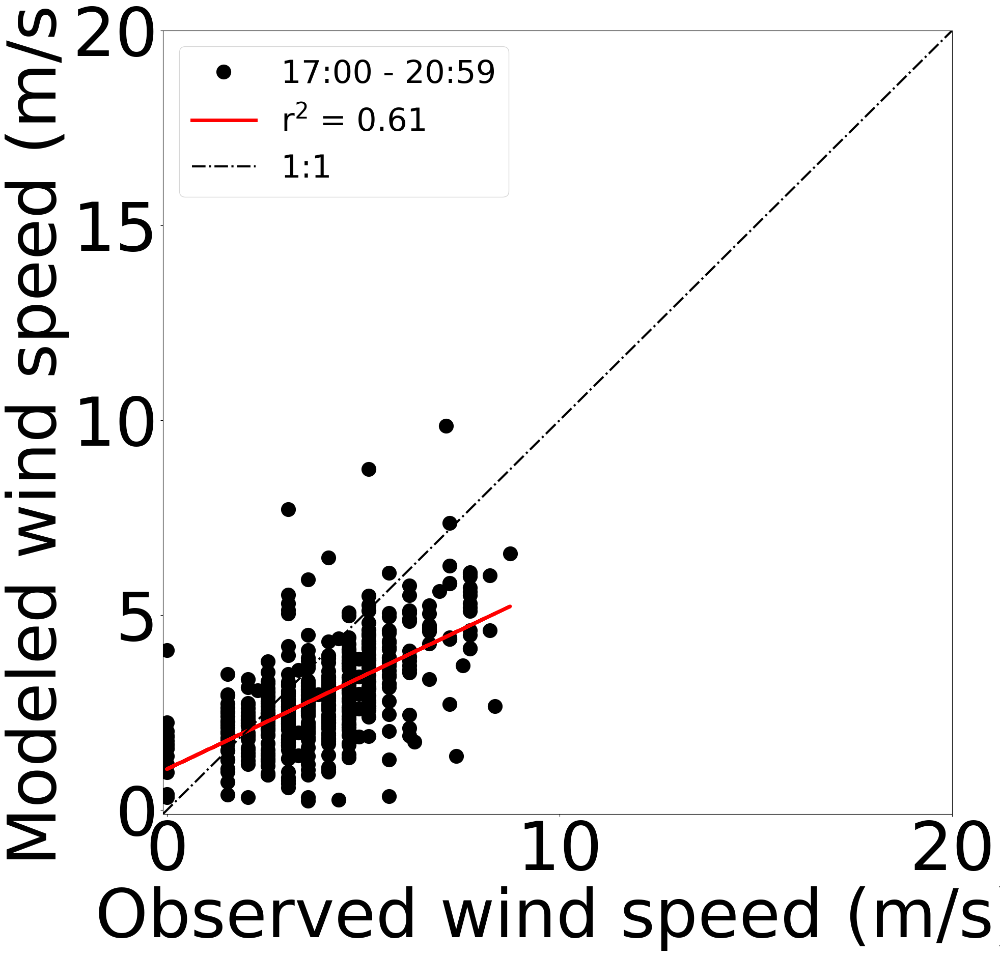

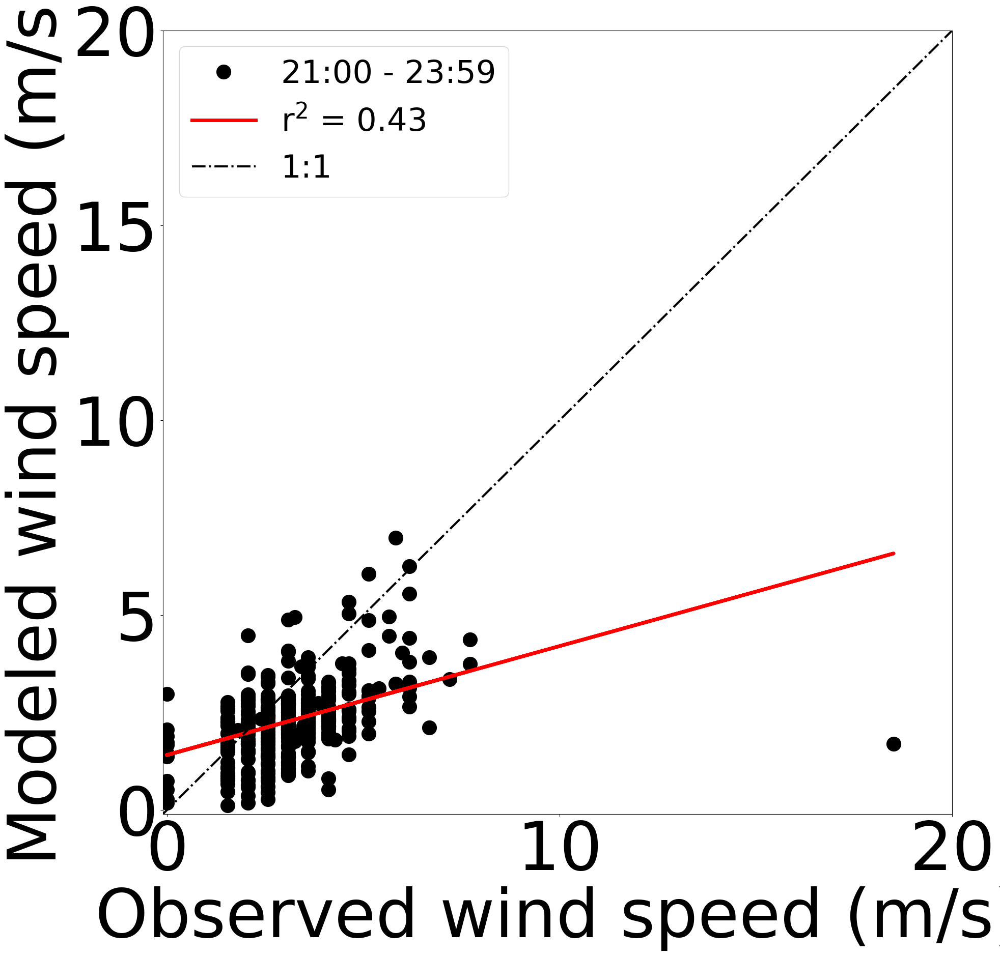

In [66]:
# Figure S9:
ax2 = ws_mod_ob(DATA['WSP'],'GROWING')

## FIGURE S2 // FIGURE S7 
* Figure S2: Dormant season (for January and February 2016): mean vertical gradients categorized according to observed wind speed (Indianapolis International Airport) and modeled turbulent kinetic energy (TKE), for different time periods of the day, for January and February 2016. (a) Wind speed and vertical gradients of CO2; (b) wind speed and vertical gradients of CH4; (c) turbulent kinetic energy and vertical gradients of CO2; (d) turbulent kinetic energy and vertical gradients of CH4.

* Figure S7: Growing season: mean vertical gradients categorized according to observed wind speed (Indianapolis International Airport) for different time periods of the day, for May, June, and July 2016. (a) vertical gradients of CO2; (b) vertical gradients of CH4.

In [67]:
## GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
temp = OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean()
## NORMALIZING VERTICAL GRADIENTS BY MID-AFTERNOON
OUTPUTS['VG_DORM_WS'] = pd.DataFrame(temp['VG']['DORMANT'])
OUTPUTS['VG_GROW_WS'] = pd.DataFrame(temp['VG']['GROWING'])

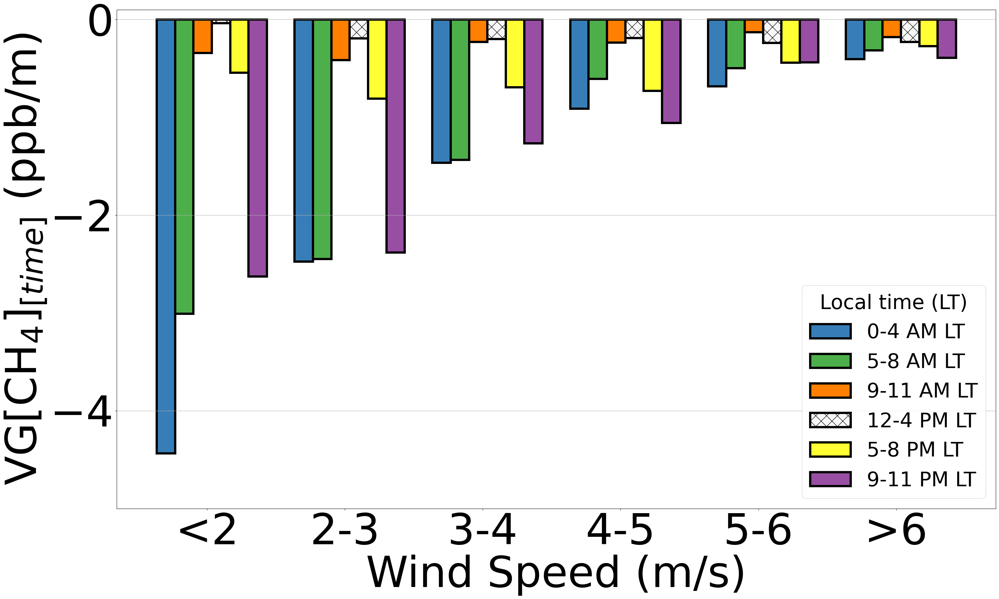

In [68]:
# For figure S2a:
ax1 = fig_vg_time_ws(OUTPUTS['VG_DORM_WS'], periods,gas)

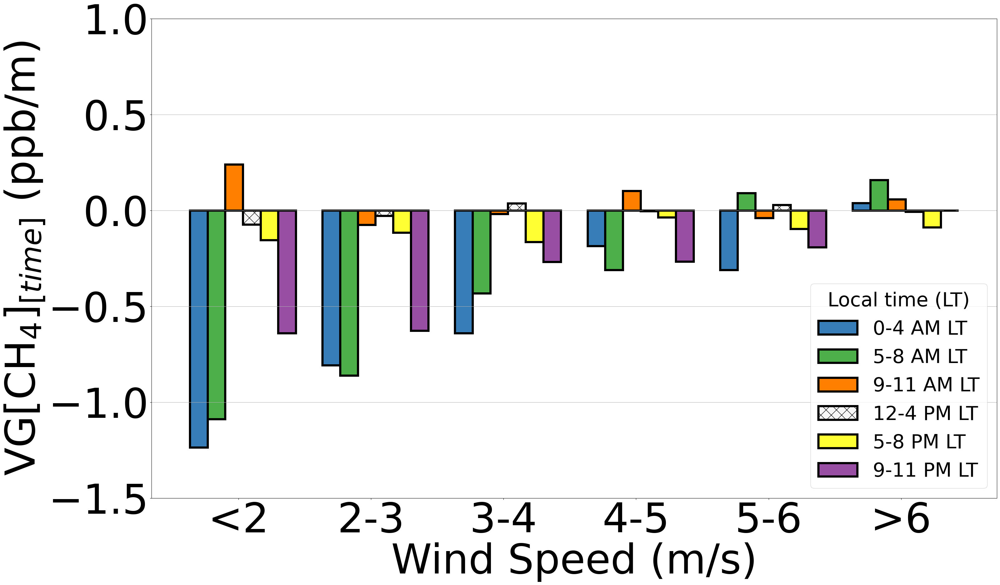

In [69]:
# For figure S7a:
ax2 = fig_vg_time_ws(OUTPUTS['VG_GROW_WS'], periods,gas)
if gas == 'ch4':
    ax2.set_ylim(-1.5,1)

## FIGURE S3 // FIGURE S8

* Figure S3: Mean vertical gradients normalized by Hestia fossil fuel emissions for January and February and then, categorized according to observed wind speed (Indianapolis International Airport) and modeled turbulent kinetic energy (TKE), for different time periods of the day. (a) Wind speed; (b) turbulent kinetic energy (TKE).

* Figure S8: Growing season: mean vertical gradients normalized by Hestia fossil fuel emissions for May, June, and July and then categorized according to observed wind speed (Indianapolis International Airport) and modeled turbulent kinetic energy (TKE) for different time periods of the day. (a) Wind speed; (b) turbulent kinetic energy.

In [70]:
if gas == 'co2':
    # Normalizing vertical gradients by ff emissions
    OUTPUTS['VERTICAL_GRAD']['VG'] = OUTPUTS['VERTICAL_GRAD']['VG']/OUTPUTS['VERTICAL_GRAD']['EMISSIONS']  

In [71]:
if gas == 'co2':
    # Calculating mean by grouping by season, period of the day, and
    # wind speed category
    OUTPUTS['VG_FF_WS'] = pd.DataFrame(OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean())
    # tke category
    OUTPUTS['VG_FF_TKE'] = pd.DataFrame(OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','TKE_level3_CAT']).mean())

In [72]:
if gas == 'co2':
    #Figure S3A
    ax1 = fig_VGFF_ws(OUTPUTS['VG_FF_WS']['VG']['DORMANT'], 'VG', periods,gas)

In [73]:
if gas == 'co2':
    # For Figure S8a 
    ax2 = fig_VGFF_ws(OUTPUTS['VG_FF_WS']['VG']['GROWING'], 'VG', periods,gas)

In [74]:
if gas == 'co2':
    #Figure S3b
    ax1 = fig_VGFF_tke(OUTPUTS['VG_FF_TKE']['VG']['DORMANT'], 'VG', periods,gas)

In [75]:
if gas == 'co2':
    # For Figure S8b 
    ax2 = fig_VGFF_tke(OUTPUTS['VG_FF_TKE']['VG']['GROWING'], 'VG', periods,gas)

## FIGURE S4

Dormant season: mean vertical gradients normalized by the mid-afternoon (12:00 to 16:59 local time) vertical gradients and then, categorized according to observed wind speed (Indianapolis International Airport) and modeled wind speed, for different time periods of the day, for January and February. (a) Wind speed and normalized vertical gradients of CO2; (b) wind speed and normalized vertical gradients of CH4.

In [76]:
OUTPUTS['VERTICAL_GRAD'] = pd.merge(OUTPUTS['VERTICAL_GRAD'],DATA['WSMODEL']['WRF_WS_CAT'], how='left', left_index = True, right_index = True)
#OUTPUTS['VERTICAL_GRAD']

In [77]:
## Calculating mean by GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
temp = OUTPUTS['VERTICAL_GRAD'].groupby(['SEASON','PERIOD','WRF_WS_CAT']).mean()
## NORMALIZING VERTICAL GRADIENTS BY MID-AFTERNOON
OUTPUTS['VG_NORM_AFT_DORM_WSMODEL'] = pd.DataFrame(temp['VG']['DORMANT']/temp['VG']['DORMANT']['12-4 PM LT'])
OUTPUTS['VG_NORM_AFT_GROW_WSMODEL'] = pd.DataFrame(temp['VG']['GROWING']/temp['VG']['GROWING']['12-4 PM LT'])

Text(0.5, 0, 'Modeled wind Speed (m/s)')

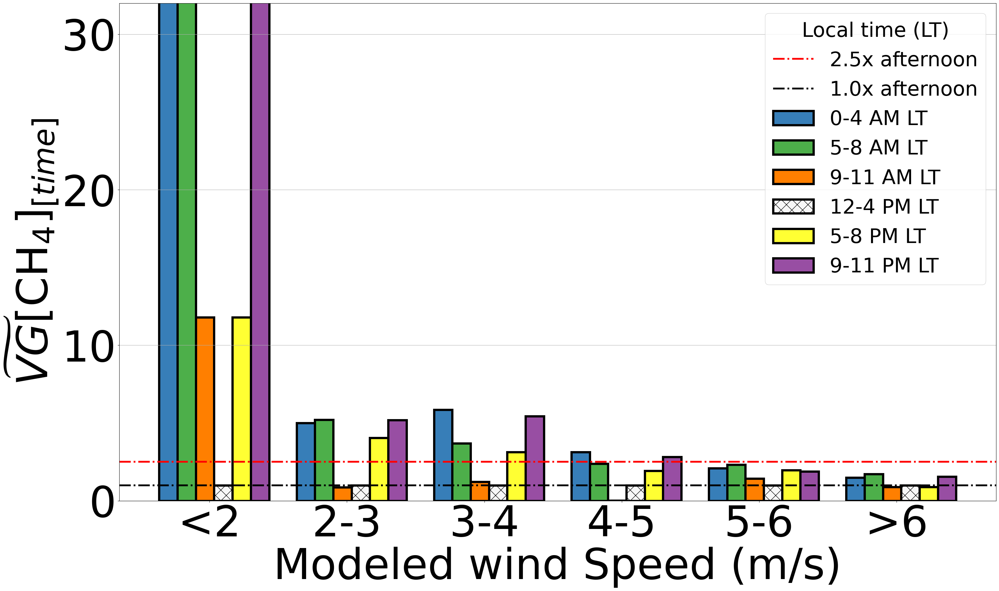

In [78]:
# fIGURE S4a // For figure S4b select gas = ch4 at the beginning of the code
ax1 = fig_vg_norm_time_ws(OUTPUTS['VG_NORM_AFT_DORM_WSMODEL'],periods,gas)
ax1.set_xlabel('Modeled wind Speed (m/s)', fontsize=95)
#ax1.get_legend().remove()

## FIGURE S5

Mean boundary layer depth bias categorized according to observed wind speed (Indianapolis International Airport), for different time periods of the day. (a) January and February; (b) May, June, and July.

In [79]:
## Calculating mean bias by GROUPING BY SEASON, PERIOD OF DAY, AND WIND SPEED CATEGORY
DATA['ABL_WS'] = pd.DataFrame(DATA['ABL'].groupby(['SEASON','PERIOD','WS_OBS_CAT']).mean())

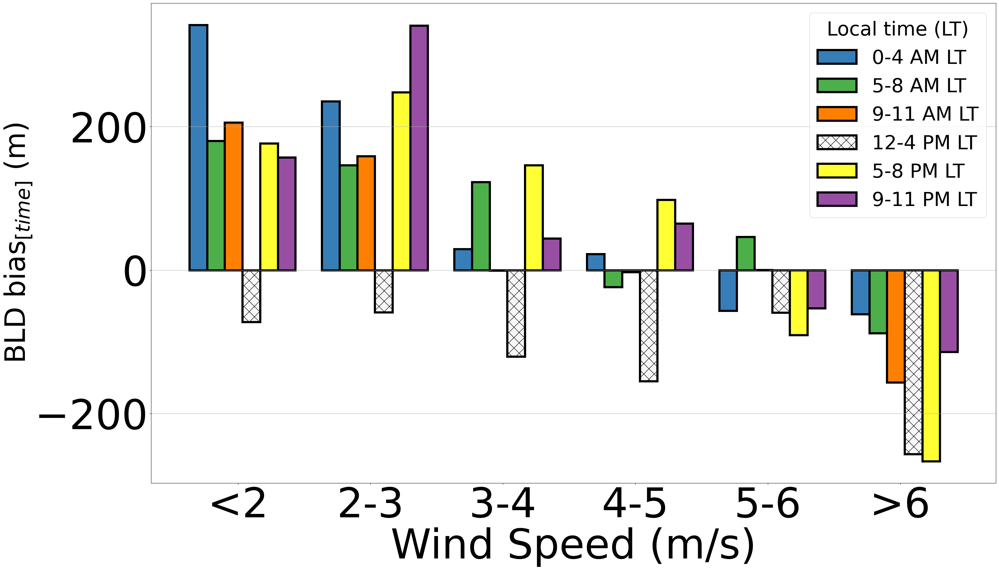

In [80]:
# Figure S5a
ax1 = fig_bld_Bias(DATA['ABL_WS']['Error']['DORMANT'],periods,gas)
#ax1.get_legend().remove()

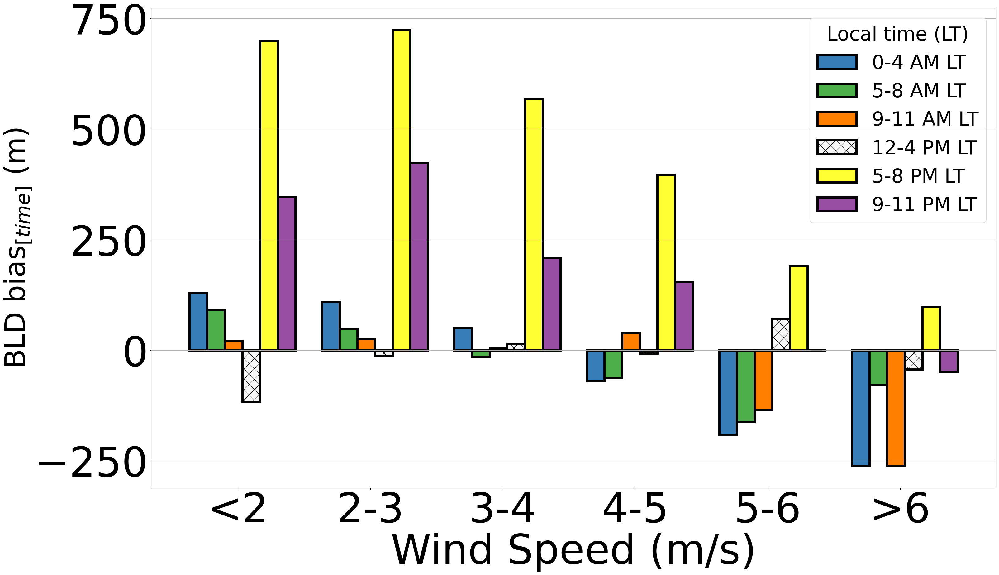

In [81]:
# Figure S5b
ax2 = fig_bld_Bias(DATA['ABL_WS']['Error']['GROWING'],periods,gas)
#ax2.get_legend().remove()

## FIGURE S6 // FIGURE S10

* Figure S6: Dormant season: modeled (WRF) and observed wind speed (Indianapolis International Airport) bias at 10 mAGL for different hours of the day, for January and February 2016. (a) 00:00 - 04:59 LT, (b) 05:00 - 08:59 LT, (c) 09:00 - 11:59 LT, (d) 12:00 - 16:59 LT, (e) 17:00 - 20:59 LT, (f) 21:00 - 23:59 LT.

* Figure S10: Growing season: modeled (WRF) and observed wind speed (Indianapolis International Airport) bias at 10 mAGL for different hours of the day, for May, June, and July 2016. (a) 00:00 - 04:59 LT, (b) 05:00 - 08:59 LT, (c) 09:00 - 11:59 LT, (d) 12:00 - 16:59 LT, (e) 17:00 - 20:59 LT, (f) 21:00 - 23:59 LT.

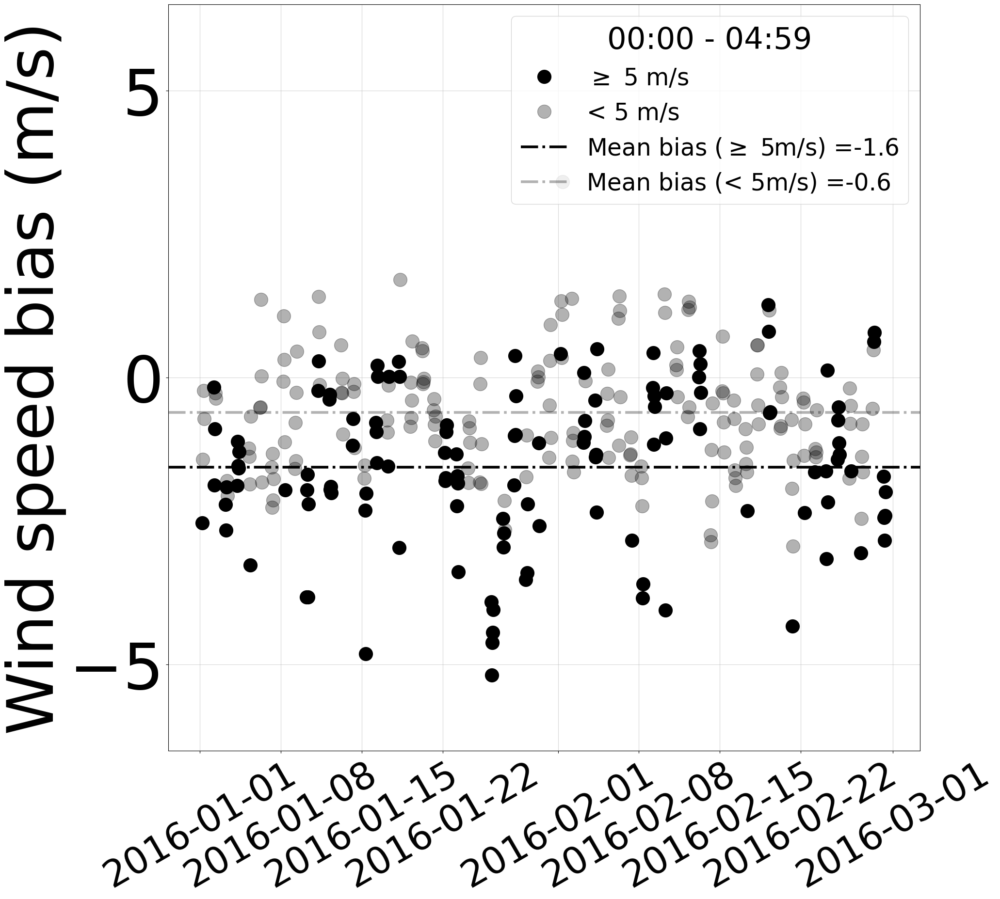

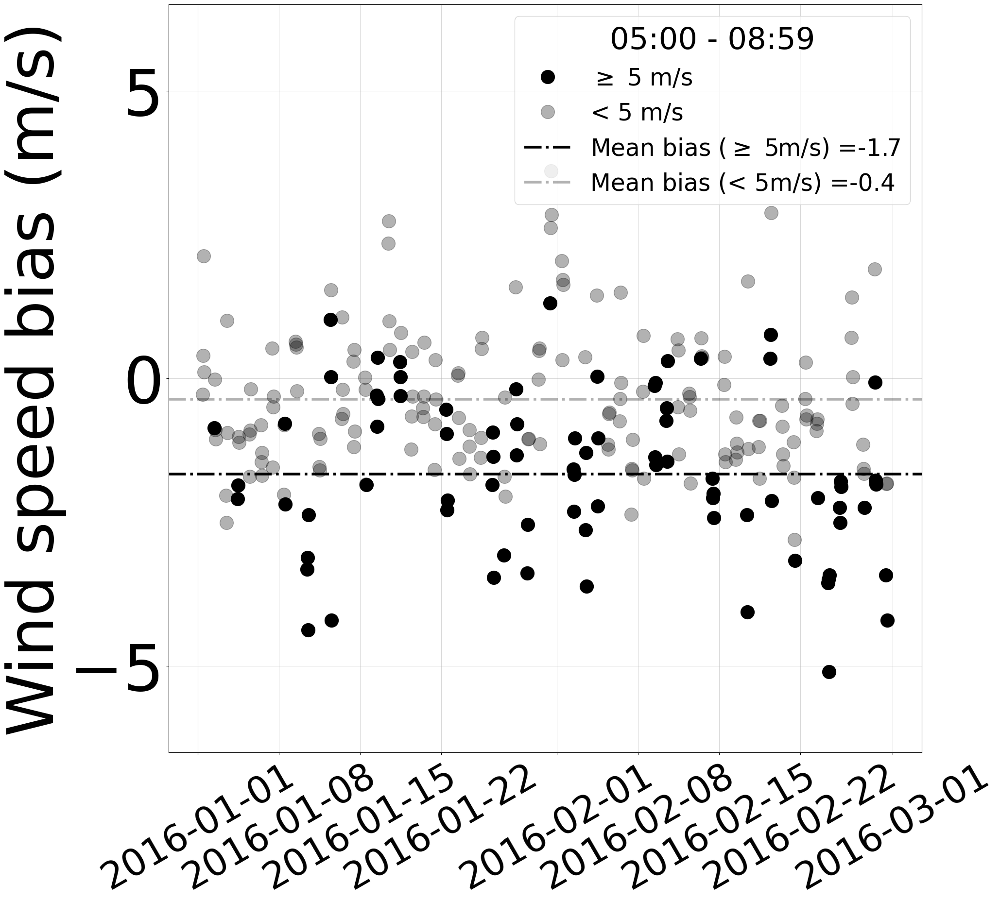

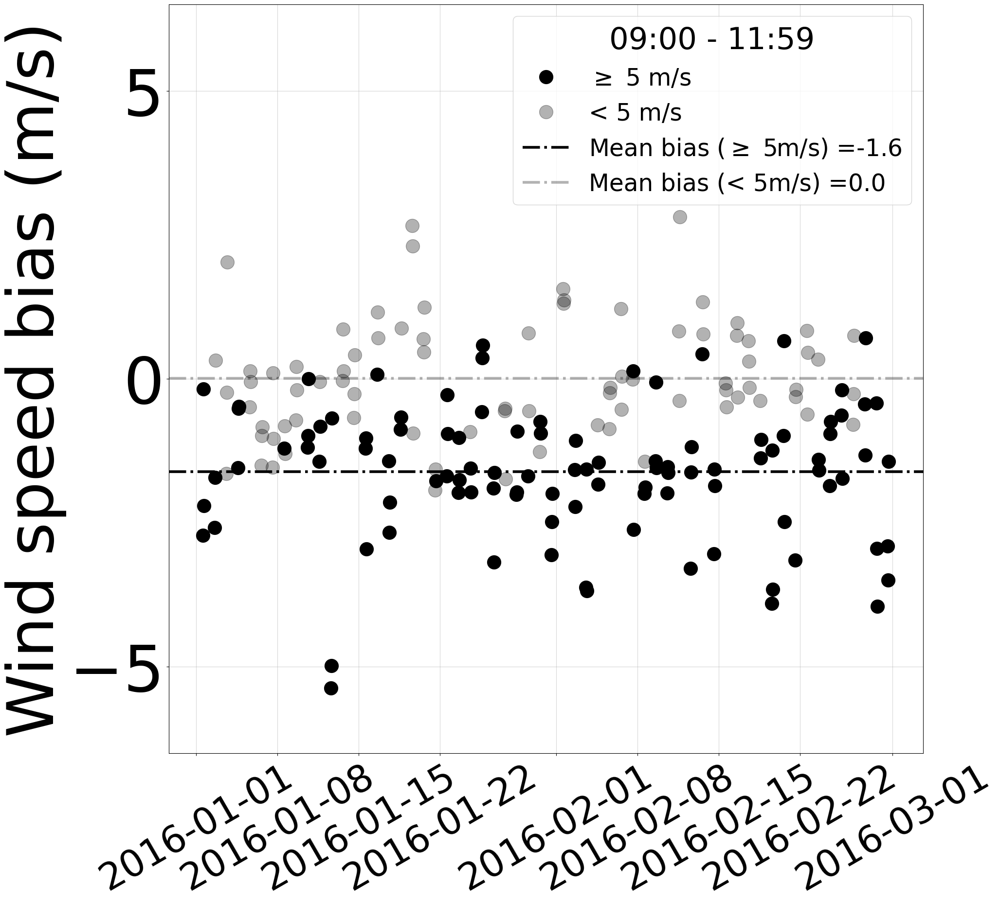

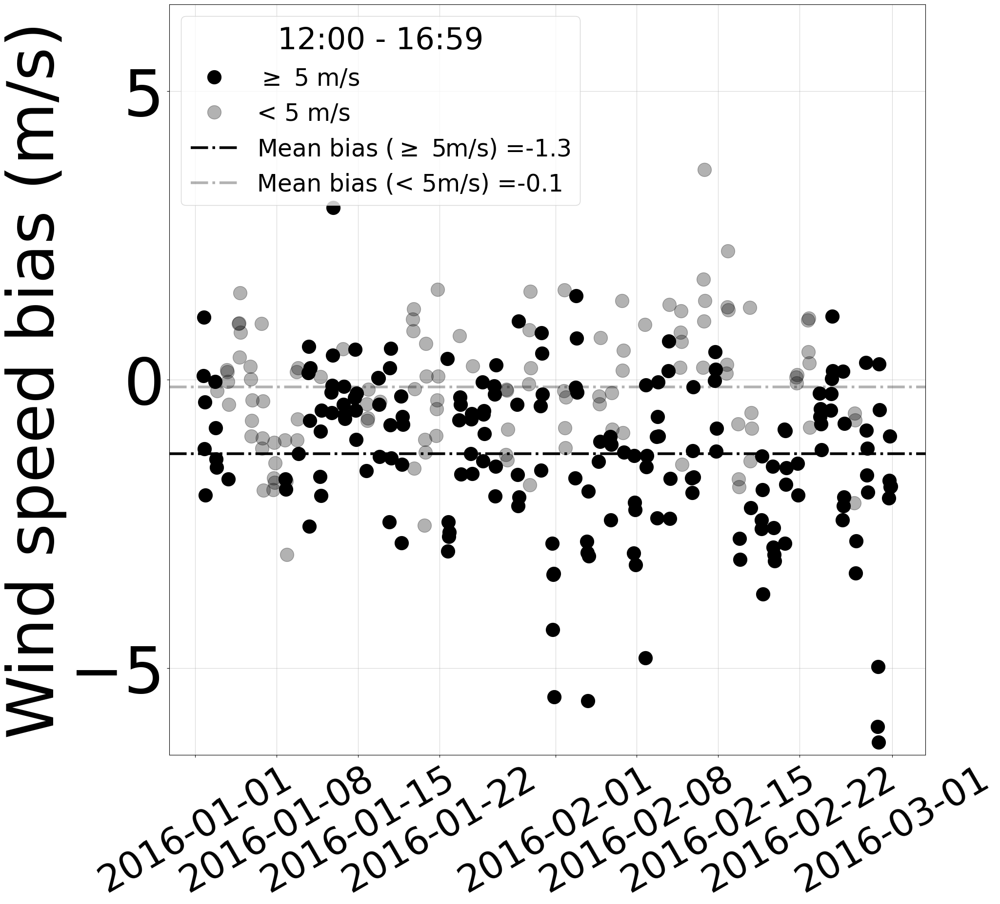

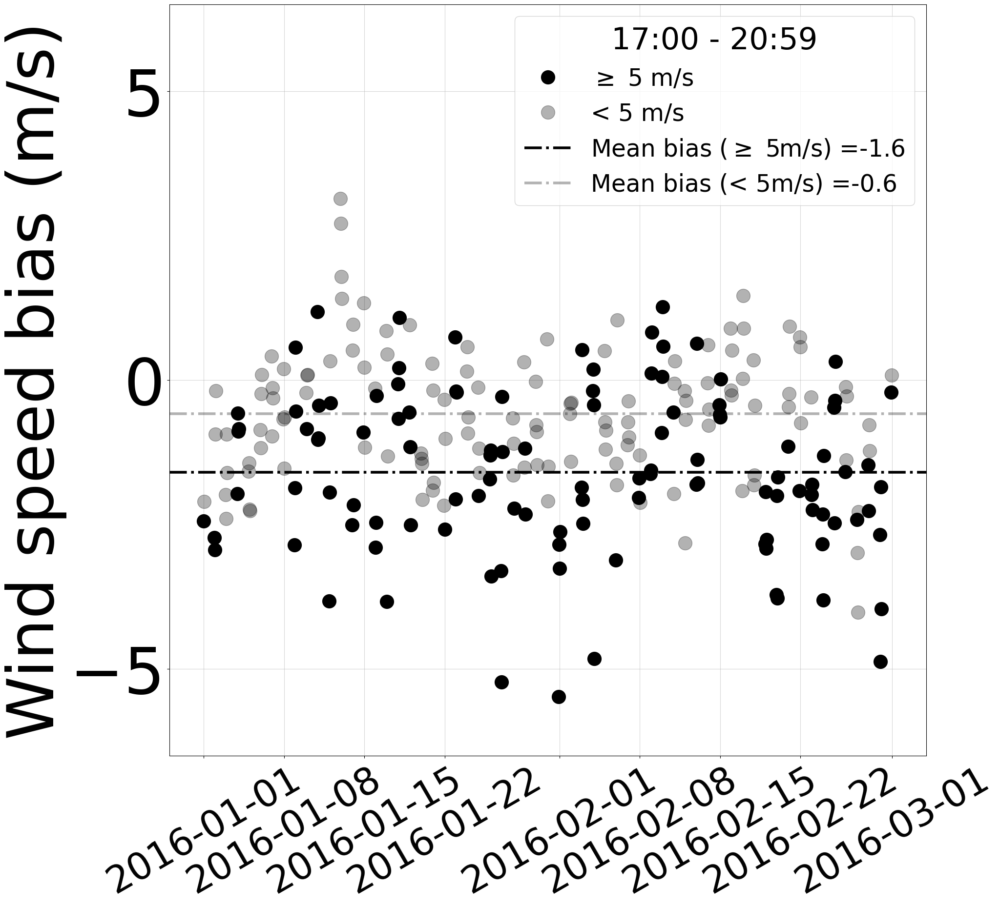

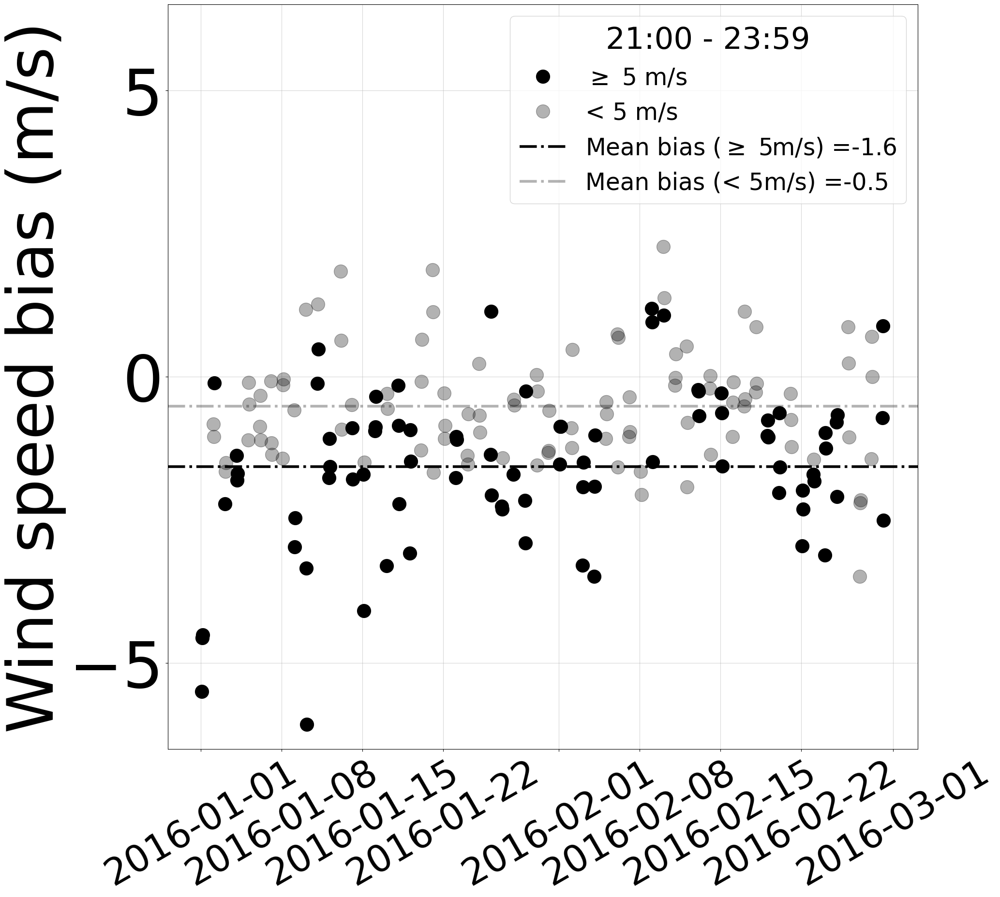

In [82]:
# Figure S6
ax1 = fig_ws_bias(DATA['WSP'], 'DORMANT')

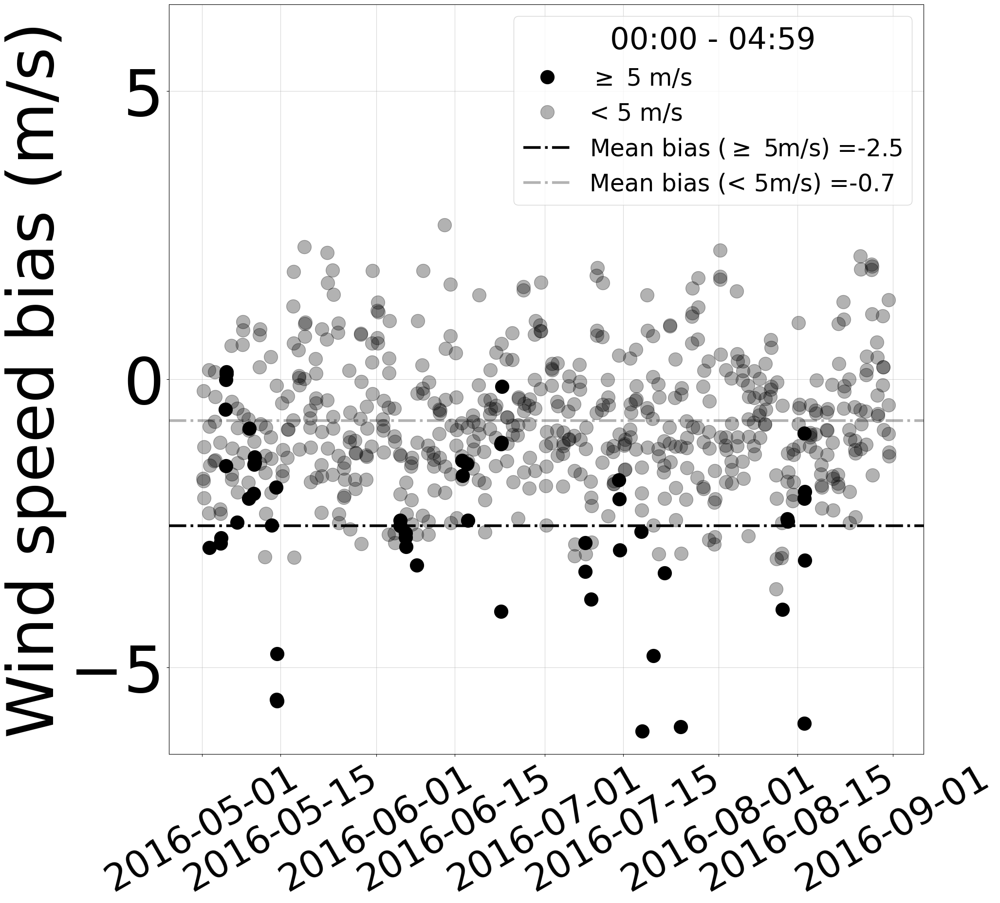

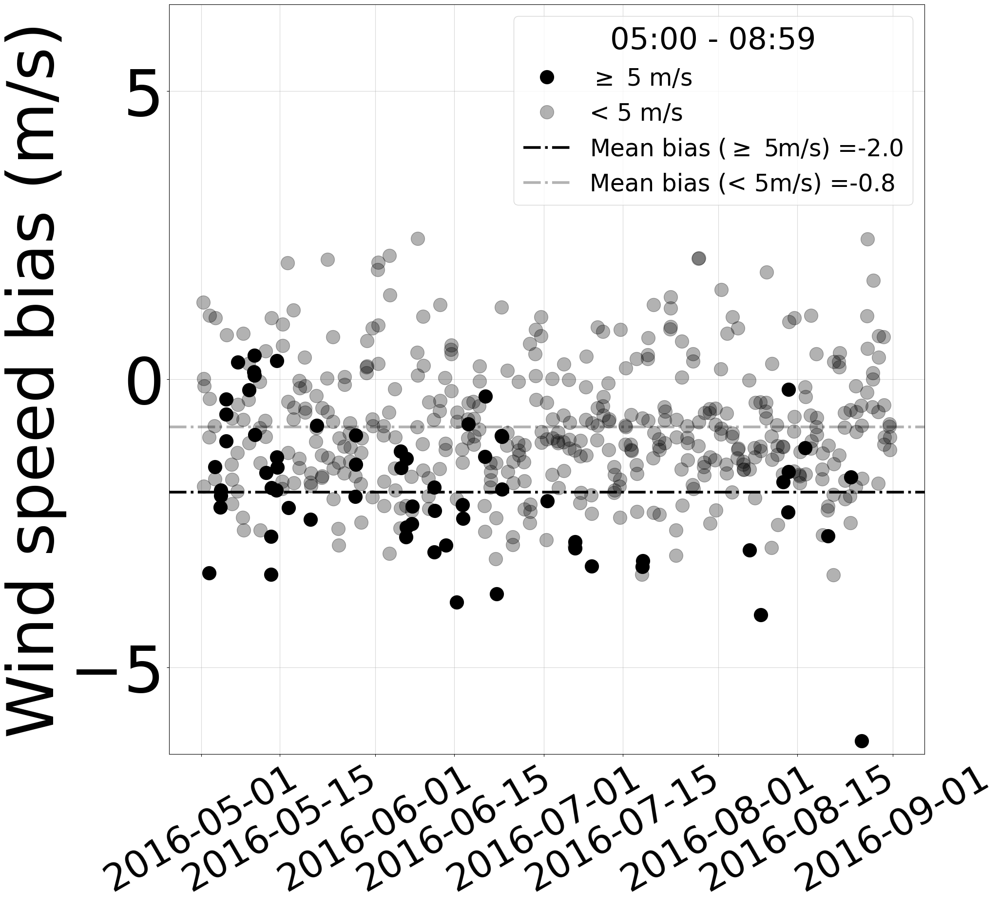

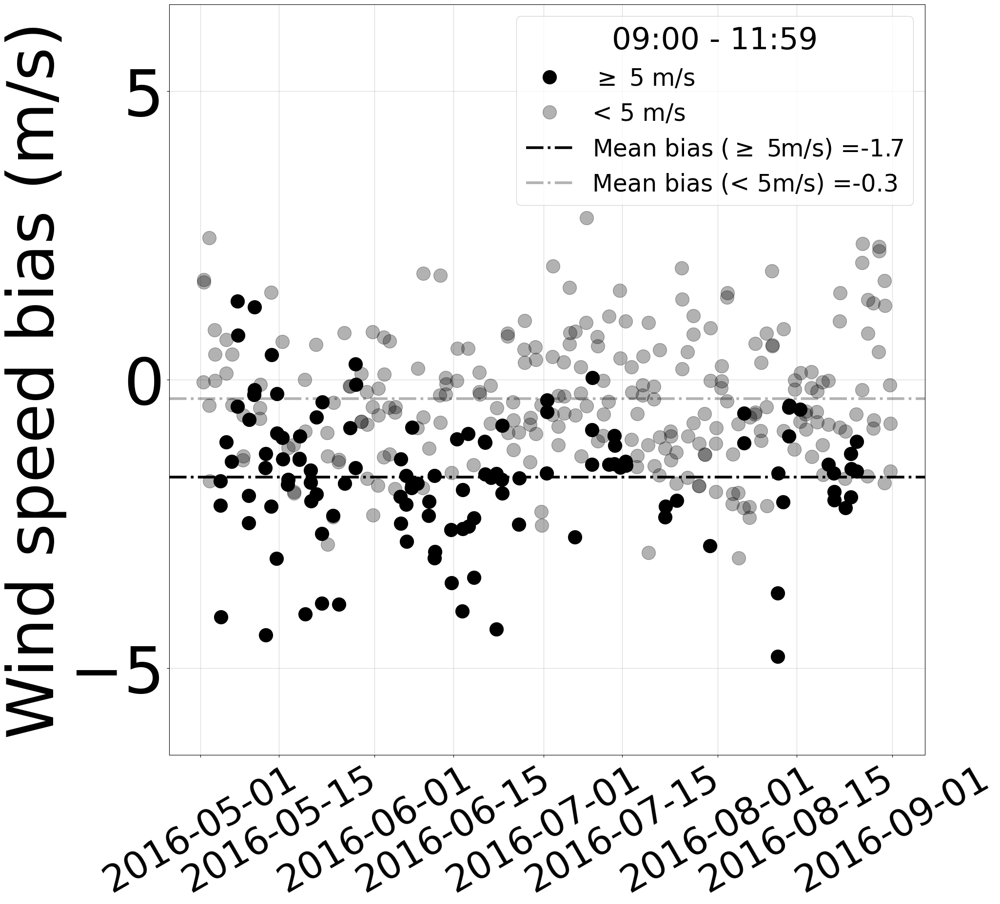

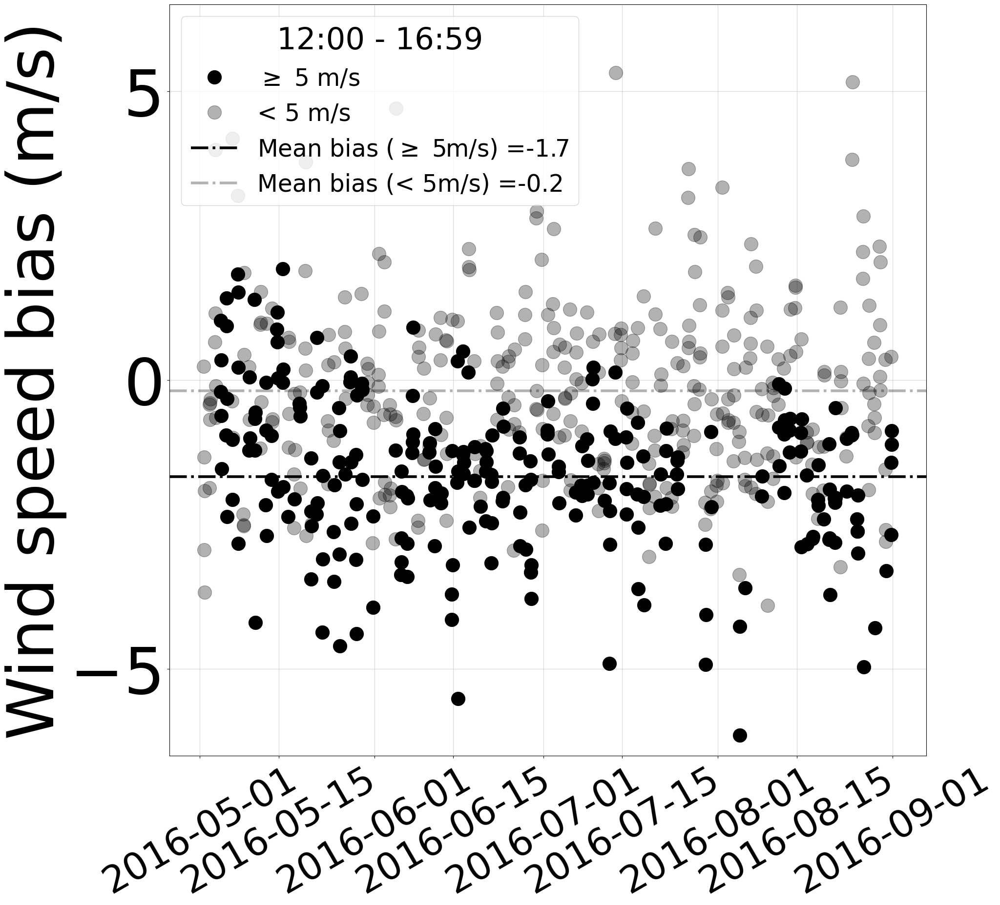

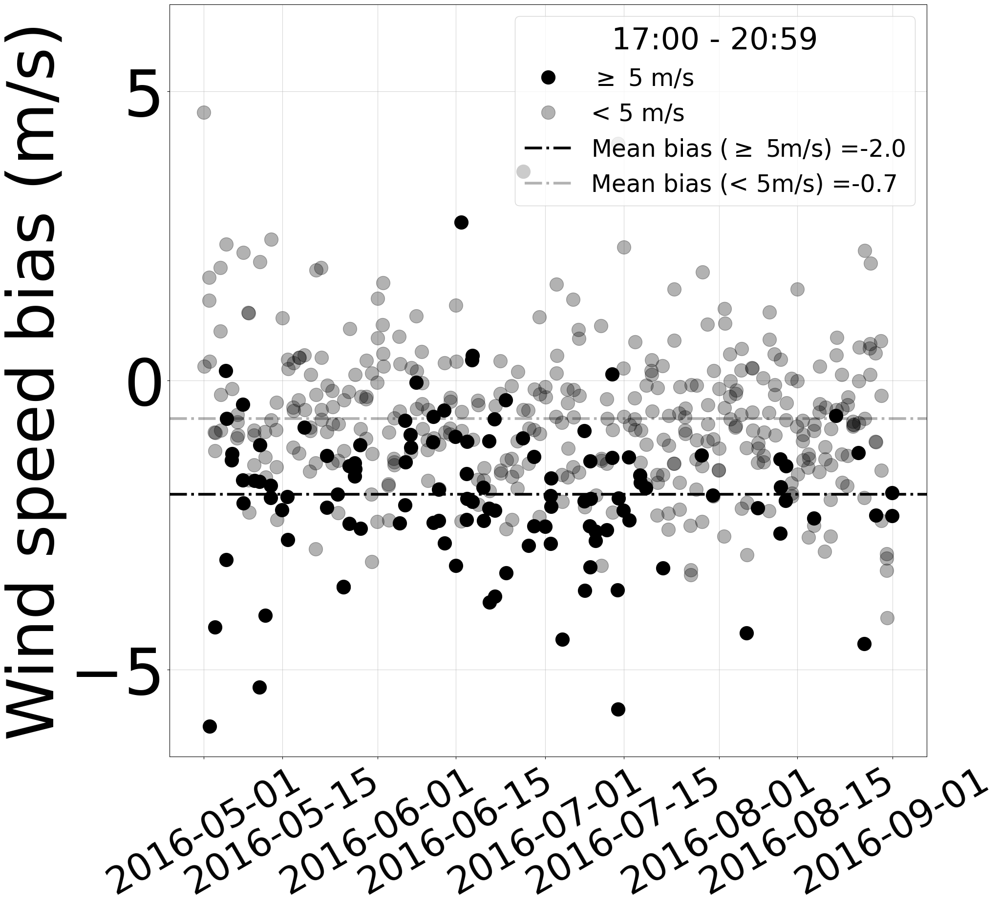

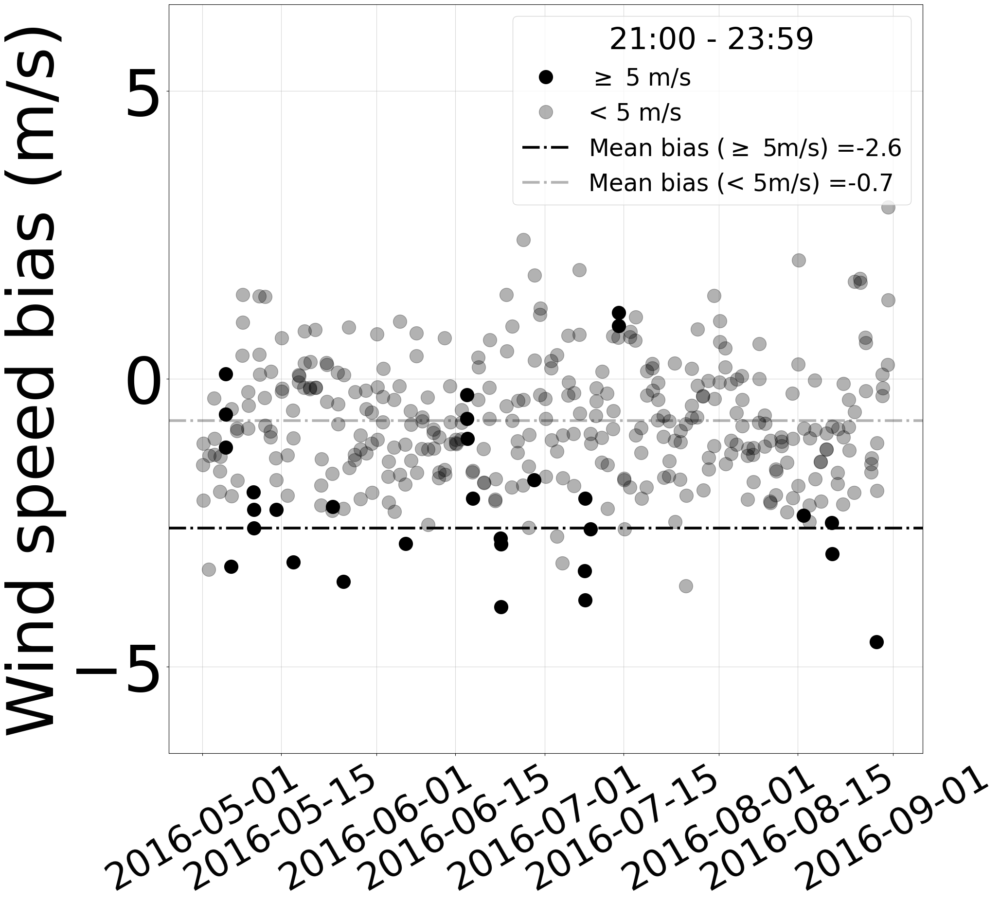

In [83]:
# Figure S10
ax2 = fig_ws_bias(DATA['WSP'], 'GROWING')

## FIGURE S11 : See Figure 5
## FIGURE S12: See Figure 3
## FIGURE S13: See Figure 6
## FIGURE S14: See Figure 7